In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv("Crimes_-_2018.csv")
data.dropna(inplace=True)
data = data.loc[(data['Primary Type'] == "THEFT")]
data["Date"] = data["Date"].str[:10]
days = np.unique(data["Date"].values)
data.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
66,11535234,JB553091,12/07/2018,0000X N STATE ST,0860,THEFT,RETAIL THEFT,DEPARTMENT STORE,True,False,...,42.0,32.0,06,1176364.0,1900524.0,2018,04/08/2019 04:11:13 PM,41.882394,-87.627845,"(41.882394062, -87.627844798)"
67,11534936,JB552789,12/10/2018,0000X N STATE ST,0860,THEFT,RETAIL THEFT,SMALL RETAIL STORE,True,False,...,42.0,32.0,06,1176364.0,1900524.0,2018,04/08/2019 04:11:13 PM,41.882394,-87.627845,"(41.882394062, -87.627844798)"
76,11526910,JB541954,12/06/2018,025XX W PETERSON AVE,0820,THEFT,$500 AND UNDER,PARKING LOT/GARAGE(NON.RESID.),True,False,...,40.0,2.0,06,1158504.0,1941992.0,2018,04/07/2019 03:58:05 PM,41.996569,-87.692288,"(41.996569131, -87.692288143)"
170,11549187,JB570115,12/28/2018,004XX W MARQUETTE RD,0860,THEFT,RETAIL THEFT,GROCERY FOOD STORE,True,False,...,6.0,68.0,06,1174441.0,1860502.0,2018,04/03/2019 04:04:24 PM,41.772613,-87.636099,"(41.772613371, -87.636098706)"
174,11498102,JB502817,11/04/2018,017XX W 66TH ST,0820,THEFT,$500 AND UNDER,RESIDENCE,True,False,...,15.0,67.0,06,1165934.0,1860929.0,2018,04/03/2019 04:04:24 PM,41.773970,-87.667271,"(41.773970137, -87.667270917)"


In [3]:
max_lat = data['Latitude'].max()
min_lat = data['Latitude'].min()
max_lon = data['Longitude'].max()
min_lon = data['Longitude'].min()
print(min_lat,max_lat,min_lon,max_lon)

41.644589713 42.022536147 -87.934272688 -87.52462380899999


In [4]:
n_rows = n_columns = 64
matrix = np.zeros(shape=(n_rows,n_columns))
n_sum_lat = (max_lat-min_lat)/n_columns
n_sum_lon = (max_lon-min_lon)/n_rows
n_days = len(days)
X = []
for k in range (n_days):
    dayk = data.loc[(data['Date'] == days[k])]
    start_lon = min_lon
    end_lon = min_lon + n_sum_lon
    for i in range (n_rows):
        start_lat = min_lat
        end_lat = min_lat + n_sum_lat
        for j in range (n_columns):
            x = dayk.loc[(dayk['Latitude'] >= start_lat) & (dayk['Latitude'] <= end_lat) & (dayk['Longitude'] >= start_lon) & (dayk['Longitude'] <= end_lon)]
            matrix[i][j] = x.shape[0]
            start_lat = end_lat
            end_lat = end_lat + n_sum_lat
        start_lon = end_lon
        end_lon = end_lon + n_sum_lon
    X.append(matrix)

In [5]:
import pickle
pickle_out = open("Matrices.pickle","wb")
pickle.dump(X,pickle_out)
pickle_out.close()

In [2]:
import pickle
pickle_in = open("Matrices.pickle","rb")
X2 = pickle.load(pickle_in)

In [3]:
division = round(len(X2) * 0.7)
training = X2[:division]
test = X2[division:]

#Con el día anterior
X1_training = []
Y1_training = []
X1_test = []
Y1_test = []
X2_reshaped = []
Y2_reshaped = []

for i in range (len(training)):
    if (i == len(training)-1):
        X1_training.append(training[i])
        Y1_training.append(training[i])
    else:
        X1_training.append(training[i])
        Y1_training.append(training[i+1])

for i in range (len(test)):
    if (i == len(test)-1):
        X1_test.append(test[i])
        Y1_test.append(test[i])
    else:
        X1_test.append(test[i])
        Y1_test.append(test[i+1])

        
for i in range (len(X2)):
    if (i == len(X2)-1):
        X2_reshaped.append(X2[i])
        Y2_reshaped.append(X2[i])
    else:
        X2_reshaped.append(X2[i])
        Y2_reshaped.append(X2[i+1])

X2_reshaped = np.array(X2_reshaped).reshape(-1,64,64,1)
Y2_reshaped = np.array(Y2_reshaped).reshape(-1,64,64,1)
X1_training = np.array(X1_training).reshape(-1,64,64,1)
Y1_training = np.array(Y1_training).reshape(-1,64,64,1)
X1_test = np.array(X1_test).reshape(-1,64,64,1)
Y1_test = np.array(Y1_test).reshape(-1,64,64,1)
print(X1_training.shape,Y1_training.shape)
print(X1_test.shape,Y1_test.shape)

(255, 64, 64, 1) (255, 64, 64, 1)
(110, 64, 64, 1) (110, 64, 64, 1)


In [4]:
#Con dos días anteriores
X2_training = []
Y2_training = []
X2_test = []
Y2_test = []

for i in range (len(training)):
    if (i == len(training)-1) or (i == len(training)-2):
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X2_training.append(creacion3)
        Y2_training.append(training[i])
    else:
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i+1]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X2_training.append(creacion3)
        Y2_training.append(training[i+2])

for i in range (len(test)):
    if (i == len(test)-1) or (i == len(test)-2):
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X2_test.append(creacion3)
        Y2_test.append(test[i])
    else:
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i+1]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X2_test.append(creacion3)
        Y2_test.append(test[i+2])
        
X2_training = np.array(X2_training).reshape(-1,64,128,1)
Y2_training = np.array(Y2_training).reshape(-1,64,64,1)
X2_test = np.array(X2_test).reshape(-1,64,128,1)
Y2_test = np.array(Y2_test).reshape(-1,64,64,1)
print(X2_training.shape,Y2_training.shape)
print(X2_test.shape,Y2_test.shape)

(255, 64, 128, 1) (255, 64, 64, 1)
(110, 64, 128, 1) (110, 64, 64, 1)


In [5]:
#Con cuatro días anteriores en vertical
X3_training_v = []
Y3_training_v = []
X3_test_v = []
Y3_test_v = []

for i in range (len(training)):
    if (i == len(training)-1) or (i == len(training)-2) or (i == len(training)-3) or (i == len(training)-4):
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i]))
        creacion3 = np.squeeze(np.asarray(training[i]))
        creacion4 = np.squeeze(np.asarray(training[i]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,128,128,1)
        X3_training_v.append(creacion5)
        Y3_training_v.append(training[i])
    else:
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i+1]))
        creacion3 = np.squeeze(np.asarray(training[i+2]))
        creacion4 = np.squeeze(np.asarray(training[i+3]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,128,128,1)
        X3_training_v.append(creacion5)
        Y3_training_v.append(training[i+4])

for i in range (len(test)):
    if (i == len(test)-1) or (i == len(test)-2) or (i == len(test)-3) or (i == len(test)-4):
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i]))
        creacion3 = np.squeeze(np.asarray(test[i]))
        creacion4 = np.squeeze(np.asarray(test[i]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,128,128,1)
        X3_test_v.append(creacion5)
        Y3_test_v.append(test[i])
    else:
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i+1]))
        creacion3 = np.squeeze(np.asarray(test[i+2]))
        creacion4 = np.squeeze(np.asarray(test[i+3]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,128,128,1)
        X3_test_v.append(creacion5)
        Y3_test_v.append(test[i+4])
        
X3_training_v = np.array(X3_training_v).reshape(-1,128,128,1)
Y3_training_v = np.array(Y3_training_v).reshape(-1,64,64,1)
X3_test_v = np.array(X3_test_v).reshape(-1,128,128,1)
Y3_test_v = np.array(Y3_test_v).reshape(-1,64,64,1)

print(X3_training_v.shape,Y3_training_v.shape)
print(X3_test_v.shape,Y3_test_v.shape)

(255, 128, 128, 1) (255, 64, 64, 1)
(110, 128, 128, 1) (110, 64, 64, 1)


In [6]:
#Con cuatro días anteriores en horizontal
X3_training_h = []
Y3_training_h = []
X3_test_h = []
Y3_test_h = []

for i in range (len(training)):
    if (i == len(training)-1) or (i == len(training)-2) or (i == len(training)-3) or (i == len(training)-4):
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i]))
        creacion3 = np.squeeze(np.asarray(training[i]))
        creacion4 = np.squeeze(np.asarray(training[i]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,64,256,1)
        X3_training_h.append(creacion5)
        Y3_training_h.append(training[i])
    else:
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i+1]))
        creacion3 = np.squeeze(np.asarray(training[i+2]))
        creacion4 = np.squeeze(np.asarray(training[i+3]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,64,256,1)
        X3_training_h.append(creacion5)
        Y3_training_h.append(training[i+4])

for i in range (len(test)):
    if (i == len(test)-1) or (i == len(test)-2) or (i == len(test)-3) or (i == len(test)-4):
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i]))
        creacion3 = np.squeeze(np.asarray(test[i]))
        creacion4 = np.squeeze(np.asarray(test[i]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,64,256,1)
        X3_test_h.append(creacion5)
        Y3_test_h.append(test[i])
    else:
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i+1]))
        creacion3 = np.squeeze(np.asarray(test[i+2]))
        creacion4 = np.squeeze(np.asarray(test[i+3]))
        creacion5 = np.vstack((creacion1,creacion2,creacion3,creacion4))
        creacion5 = np.array(creacion5).reshape(-1,64,256,1)
        X3_test_h.append(creacion5)
        Y3_test_h.append(test[i+4])
        
X3_training_h = np.array(X3_training_h).reshape(-1,64,256,1)
Y3_training_h = np.array(Y3_training_h).reshape(-1,64,64,1)
X3_test_h = np.array(X3_test_h).reshape(-1,64,256,1)
Y3_test_h = np.array(Y3_test_h).reshape(-1,64,64,1)

print(X3_training_h.shape,Y3_training_h.shape)
print(X3_test_h.shape,Y3_test_h.shape)

(255, 64, 256, 1) (255, 64, 64, 1)
(110, 64, 256, 1) (110, 64, 64, 1)


In [7]:
#Con el mismo día de la semana anterior
X4_training = []
Y4_training = []
X4_test = []
Y4_test = []

for i in range (len(training)):
    if (i == len(training)-1) or (i == len(training)-2) or (i == len(training)-3)  or (i == len(training)-4)  or (i == len(training)-5) or (i == len(training)-6):
        X4_training.append(training[i])
        Y4_training.append(training[i])
    else:
        X4_training.append(training[i])
        Y4_training.append(training[i+6])

for i in range (len(test)):
    if (i == len(test)-1) or (i == len(test)-2) or (i == len(test)-3) or (i == len(test)-4) or (i == len(test)-5) or (i == len(test)-6):
        X4_test.append(test[i])
        Y4_test.append(test[i])
    else:
        X4_test.append(test[i])
        Y4_test.append(test[i+6])
        
X4_training = np.array(X4_training).reshape(-1,64,64,1)
Y4_training = np.array(Y4_training).reshape(-1,64,64,1)
X4_test = np.array(X4_test).reshape(-1,64,64,1)
Y4_test = np.array(Y4_test).reshape(-1,64,64,1)
print(X4_training.shape,Y4_training.shape)
print(X4_test.shape,Y4_test.shape)

(255, 64, 64, 1) (255, 64, 64, 1)
(110, 64, 64, 1) (110, 64, 64, 1)


In [8]:
#Con tres días
X5_training = []
Y5_training = []
X5_test = []
Y5_test = []

for i in range (len(training)):
    if (i == len(training)-1) or (i == len(training)-2)or (i == len(training)-3):
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i]))
        creacion3 = np.squeeze(np.asarray(training[i]))
        creacion4 = np.vstack((creacion1,creacion2,creacion3))
        creacion4 = np.array(creacion4).reshape(-1,64,192,1)
        X5_training.append(creacion4)
        Y5_training.append(training[i])
    else:
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i+1]))
        creacion3 = np.squeeze(np.asarray(training[i+2]))
        creacion4 = np.vstack((creacion1,creacion2,creacion3))
        creacion4 = np.array(creacion4).reshape(-1,64,192,1)
        X5_training.append(creacion4)
        Y5_training.append(training[i+3])

for i in range (len(test)):
    if (i == len(test)-1) or (i == len(test)-2) or (i == len(test)-3):
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i]))
        creacion3 = np.squeeze(np.asarray(test[i]))
        creacion4 = np.vstack((creacion1,creacion2,creacion3))
        creacion4 = np.array(creacion4).reshape(-1,64,192,1)
        X5_test.append(creacion4)
        Y5_test.append(test[i])
    else:
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i+1]))
        creacion3 = np.squeeze(np.asarray(test[i+2]))
        creacion4 = np.vstack((creacion1,creacion2,creacion3))
        creacion4 = np.array(creacion4).reshape(-1,64,192,1)
        X5_test.append(creacion4)
        Y5_test.append(test[i+3])
        
X5_training = np.array(X5_training).reshape(-1,64,192,1)
Y5_training = np.array(Y5_training).reshape(-1,64,64,1)
X5_test = np.array(X5_test).reshape(-1,64,192,1)
Y5_test = np.array(Y5_test).reshape(-1,64,64,1)
print(X5_training.shape,Y5_training.shape)
print(X5_test.shape,Y5_test.shape)

(255, 64, 192, 1) (255, 64, 64, 1)
(110, 64, 192, 1) (110, 64, 64, 1)


In [9]:
#Con el mismo día de la semana anterior y un día anterior al día actual
X6_training = []
Y6_training = []
X6_test = []
Y6_test = []

for i in range (len(training)):
    if (i == len(training)-1) or (i == len(training)-2) or (i == len(training)-3)  or (i == len(training)-4)  or (i == len(training)-5) or (i == len(training)-6)or (i == len(training)-7):
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X6_training.append(creacion3)
        Y6_training.append(training[i])
    else:
        creacion1 = np.squeeze(np.asarray(training[i]))
        creacion2 = np.squeeze(np.asarray(training[i+6]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X6_training.append(creacion3)
        Y6_training.append(training[i+7])

for i in range (len(test)):
    if (i == len(test)-1) or (i == len(test)-2) or (i == len(test)-3) or (i == len(test)-4) or (i == len(test)-5) or (i == len(test)-6) or (i == len(test)-7):
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X6_test.append(creacion3)
        Y6_test.append(test[i])
    else:
        creacion1 = np.squeeze(np.asarray(test[i]))
        creacion2 = np.squeeze(np.asarray(test[i+6]))
        creacion3 = np.vstack((creacion1,creacion2))
        creacion3 = np.array(creacion3).reshape(-1,64,128,1)
        X6_test.append(creacion3)
        Y6_test.append(test[i+7])
            
X6_training = np.array(X6_training).reshape(-1,64,128,1)
Y6_training = np.array(Y6_training).reshape(-1,64,64,1)
X6_test = np.array(X6_test).reshape(-1,64,128,1)
Y6_test = np.array(Y6_test).reshape(-1,64,64,1)
print(X6_training.shape,Y6_training.shape)
print(X6_test.shape,Y6_test.shape)

(255, 64, 128, 1) (255, 64, 64, 1)
(110, 64, 128, 1) (110, 64, 64, 1)


In [120]:
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(64, (6, 6), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(32, (6, 6), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (6, 6), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (6, 6), activation='linear', padding='same')(up3)

autoencoder1 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 64, 64, 64)        2368      
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 32, 32, 32)        73760     
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 16, 16, 32)        36896     
_________________________________________________________________
max_pooling2d_33 (MaxPooling (None, 8, 8, 32)          0         
__________

In [121]:
from keras import backend as K
def coeff_determination(y_true,y_pred):
    SS_res = K.sum(K.square(y_true-y_pred))
    SS_tot = K.sum(K.square(y_true-K.mean(y_true)))
    return (1-SS_res/(SS_tot+K.epsilon()))
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

autoencoder1.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])

In [122]:
epochs = 2000
batch_size = 32
history_1 = autoencoder1.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 1s - loss: 0.2349 - coeff_determination: 0.0129 - mean_absolute_percentage_error: 36020012.3373 - mean_absolute_error: 0.0715 - val_loss: 0.2293 - val_coeff_determination: 0.0598 - val_mean_absolute_percentage_error: 19809256.7636 - val_mean_absolute_error: 0.0555
Epoch 2/2000
 - 0s - loss: 0.2234 - coeff_determination: 0.1077 - mean_absolute_percentage_error: 31479848.5412 - mean_absolute_error: 0.0649 - val_loss: 0.2150 - val_coeff_determination: 0.1734 - val_mean_absolute_percentage_error: 28204258.2909 - val_mean_absolute_error: 0.0610
Epoch 3/2000
 - 0s - loss: 0.2066 - coeff_determination: 0.2368 - mean_absolute_percentage_error: 38898789.1922 - mean_absolute_error: 0.0689 - val_loss: 0.1956 - val_coeff_determination: 0.3162 - val_mean_absolute_percentage_error: 37339486.0364 - val_mean_absolute_error: 0.0661
Epoch 4/2000
 - 0s - loss: 0.1879 - coeff_determination: 0.3683 - mean_absolute_percentage_error: 39114277.8667

In [ ]:
import tensorflow as tf
#Datos a probar
df_test = X1_test

predictions_batch = autoencoder1.predict(X1_test)
predictions_rank = tf.nn.top_k(predictions_batch, sorted=True, name='prediction_rank').indices
real_rank = tf.nn.top_k(Y1_test, sorted=True, name='real_rank').indices
rank_diffs = predictions_rank - real_rank
rank_diffs_squared_sum = tf.reduce_sum(rank_diffs * rank_diffs)
six = tf.constant(6)
one = tf.constant(1.0)
numerator = tf.cast(six * rank_diffs_squared_sum, dtype=tf.float32)
divider = tf.cast(df_test.shape[0] * df_test.shape[0] * df_test.shape[0] - df_test.shape[0], dtype=tf.float32)
spearman = one - numerator / divider
with tf.Session() as sess:     
    print(sess.run(spearman))

In [ ]:
from keras.layers import ZeroPadding2D
input_nn = Input(shape=X2_training.shape[1:]) 
# Encoder
first_1 = ZeroPadding2D(padding=((64,0),(0,0)))(input_nn)
conv1_1 = Conv2D(64, (6, 6), activation='relu', padding='same')(first_1)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(32, (6, 6), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (6, 6), activation='relu', padding='same')(up2)
output_nn = Conv2D(1, (6, 6), activation='linear', padding='same')(conv2_3)

autoencoder2 = Model(inputs=input_nn, outputs=output_nn)
autoencoder2.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder2.summary()

In [19]:
epochs = 1000
batch_size = 32
history_2 = autoencoder2.fit(X2_training, Y2_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X2_test,Y2_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2329 - coeff_determination: 0.0307 - mean_absolute_percentage_error: 36876485.9294 - mean_absolute_error: 0.0723 - val_loss: 0.2310 - val_coeff_determination: 0.0461 - val_mean_absolute_percentage_error: 40248184.0000 - val_mean_absolute_error: 0.0752
Epoch 2/1000
 - 0s - loss: 0.2292 - coeff_determination: 0.0613 - mean_absolute_percentage_error: 36621353.2706 - mean_absolute_error: 0.0714 - val_loss: 0.2262 - val_coeff_determination: 0.0854 - val_mean_absolute_percentage_error: 36601723.4909 - val_mean_absolute_error: 0.0709
Epoch 3/1000
 - 0s - loss: 0.2228 - coeff_determination: 0.1126 - mean_absolute_percentage_error: 36640333.5843 - mean_absolute_error: 0.0703 - val_loss: 0.2176 - val_coeff_determination: 0.1535 - val_mean_absolute_percentage_error: 36363815.4909 - val_mean_absolute_error: 0.0692
Epoch 4/1000
 - 0s - loss: 0.2132 - coeff_determination: 0.1871 - mean_absolute_percentage_error: 35725099.8431

In [14]:
epochs = 2000
batch_size = 32
history_2 = autoencoder2.fit(X2_training, Y2_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X2_test,Y2_test))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 1s - loss: 0.2434 - coeff_determination: -6.2131e-02 - mean_absolute_percentage_error: 32953978.6328 - mean_absolute_error: 0.0691 - val_loss: 0.2392 - val_coeff_determination: -2.3191e-02 - val_mean_absolute_percentage_error: 1729850.2500 - val_mean_absolute_error: 0.0395
Epoch 2/2000
 - 0s - loss: 0.2388 - coeff_determination: -1.9627e-02 - mean_absolute_percentage_error: 4513111.3961 - mean_absolute_error: 0.0422 - val_loss: 0.2383 - val_coeff_determination: -1.4768e-02 - val_mean_absolute_percentage_error: 8554326.0000 - val_mean_absolute_error: 0.0461
Epoch 3/2000
 - 0s - loss: 0.2378 - coeff_determination: -1.1160e-02 - mean_absolute_percentage_error: 12148821.8824 - mean_absolute_error: 0.0496 - val_loss: 0.2373 - val_coeff_determination: -6.7710e-03 - val_mean_absolute_percentage_error: 17040581.7455 - val_mean_absolute_error: 0.0543
Epoch 4/2000
 - 0s - loss: 0.2370 - coeff_determination: -3.9998e-03 - mean_absolute

In [15]:
from keras.models import Model
from keras.layers import Input, add, ZeroPadding2D
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X3_training_h.shape[1:]) 
# Encoder
first_1 = ZeroPadding2D(padding=((192,0),(0,0)))(input_nn)
conv1_1 = Conv2D(64, (6, 6), activation='relu', padding='same')(first_1)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool2)
pool3 = MaxPooling2D((2, 2), padding='same')(conv1_3)
h = MaxPooling2D((2, 2), padding='same')(pool3)

# Decoder
conv2_1 = Conv2D(32, (6, 6), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (6, 6), activation='relu', padding='same')(up2)
output_nn = Conv2D(1, (6, 6), activation='linear', padding='same')(conv2_3)

autoencoder3_h_6x6 = Model(inputs=input_nn, outputs=output_nn)
autoencoder3_h_6x6.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder3_h_6x6.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 64, 256, 1)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 256, 256, 1)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 256, 256, 64)      2368      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 128, 128, 32)      73760     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 64, 64, 32)        36896     
__________

In [16]:
epochs = 2000
batch_size = 32
history_3_h_6x6 = autoencoder3_h_6x6.fit(X3_training_h, Y3_training_h, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X3_test_h,Y3_test_h))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 2s - loss: 0.2356 - coeff_determination: 0.0076 - mean_absolute_percentage_error: 31177510.4314 - mean_absolute_error: 0.0669 - val_loss: 0.2287 - val_coeff_determination: 0.0651 - val_mean_absolute_percentage_error: 43908820.0000 - val_mean_absolute_error: 0.0782
Epoch 2/2000
 - 1s - loss: 0.2244 - coeff_determination: 0.0995 - mean_absolute_percentage_error: 38375742.4314 - mean_absolute_error: 0.0721 - val_loss: 0.2141 - val_coeff_determination: 0.1809 - val_mean_absolute_percentage_error: 29463720.5091 - val_mean_absolute_error: 0.0623
Epoch 3/2000
 - 1s - loss: 0.2019 - coeff_determination: 0.2702 - mean_absolute_percentage_error: 36898788.2667 - mean_absolute_error: 0.0667 - val_loss: 0.1891 - val_coeff_determination: 0.3606 - val_mean_absolute_percentage_error: 37949777.0182 - val_mean_absolute_error: 0.0656
Epoch 4/2000
 - 1s - loss: 0.1819 - coeff_determination: 0.4083 - mean_absolute_percentage_error: 36754997.6627

In [29]:
epochs = 1000
batch_size = 32
history_3_h_3x6 = autoencoder3_h_3x6.fit(X3_training_h, Y3_training_h, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X3_test_h,Y3_test_h))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 2s - loss: 0.2300 - coeff_determination: 0.0537 - mean_absolute_percentage_error: 34462294.1020 - mean_absolute_error: 0.0696 - val_loss: 0.2182 - val_coeff_determination: 0.1488 - val_mean_absolute_percentage_error: 32018184.2545 - val_mean_absolute_error: 0.0658
Epoch 2/1000
 - 1s - loss: 0.2076 - coeff_determination: 0.2284 - mean_absolute_percentage_error: 39867349.7255 - mean_absolute_error: 0.0709 - val_loss: 0.1933 - val_coeff_determination: 0.3318 - val_mean_absolute_percentage_error: 39656888.5091 - val_mean_absolute_error: 0.0685
Epoch 3/1000
 - 1s - loss: 0.1867 - coeff_determination: 0.3763 - mean_absolute_percentage_error: 39267741.7412 - mean_absolute_error: 0.0673 - val_loss: 0.1789 - val_coeff_determination: 0.4278 - val_mean_absolute_percentage_error: 35859193.5273 - val_mean_absolute_error: 0.0632
Epoch 4/1000
 - 1s - loss: 0.1719 - coeff_determination: 0.4712 - mean_absolute_percentage_error: 36329014.9020

In [30]:
autoencoder3_h_3x6.save("autoencoder3_h_3x6_1000epochs.h5")

In [31]:
epochs = 1000
batch_size = 32
history_3_h_3x6 = autoencoder3_h_3x6.fit(X3_training_h, Y3_training_h, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X3_test_h,Y3_test_h))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.0911 - coeff_determination: 0.8517 - mean_absolute_percentage_error: 6975773.8765 - mean_absolute_error: 0.0139 - val_loss: 0.0911 - val_coeff_determination: 0.8517 - val_mean_absolute_percentage_error: 6961541.1909 - val_mean_absolute_error: 0.0139
Epoch 2/1000
 - 1s - loss: 0.0911 - coeff_determination: 0.8517 - mean_absolute_percentage_error: 6958196.9431 - mean_absolute_error: 0.0139 - val_loss: 0.0911 - val_coeff_determination: 0.8517 - val_mean_absolute_percentage_error: 6950154.6818 - val_mean_absolute_error: 0.0138
Epoch 3/1000
 - 1s - loss: 0.0911 - coeff_determination: 0.8517 - mean_absolute_percentage_error: 6947071.9255 - mean_absolute_error: 0.0138 - val_loss: 0.0911 - val_coeff_determination: 0.8517 - val_mean_absolute_percentage_error: 6945242.3091 - val_mean_absolute_error: 0.0138
Epoch 4/1000
 - 1s - loss: 0.0911 - coeff_determination: 0.8517 - mean_absolute_percentage_error: 6942611.4549 - mean

In [32]:
autoencoder3_h_3x6.save("autoencoder3_h_3x6_2000epochs.h5")

In [18]:
autoencoder3_h.save("autoencoder3_h_1000epochs.h5")

In [60]:
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X4_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(64, (6, 6), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(32, (6, 6), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (6, 6), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (6, 6), activation='linear', padding='same')(up3)

autoencoder4 = Model(inputs=input_nn, outputs=output_nn)
autoencoder4.summary()
autoencoder4.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 64, 64, 64)        2368      
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 32, 32, 32)        73760     
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 16, 16, 32)        36896     
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 8, 8, 32)          0         
__________

In [61]:
epochs = 2000
batch_size = 32
history_4 = autoencoder4.fit(X4_training, Y4_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X4_test,Y4_test))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 1s - loss: 0.2379 - coeff_determination: -1.5662e-02 - mean_absolute_percentage_error: 55952822.4471 - mean_absolute_error: 0.0911 - val_loss: 0.2287 - val_coeff_determination: 0.0647 - val_mean_absolute_percentage_error: 26719881.2727 - val_mean_absolute_error: 0.0617
Epoch 2/2000
 - 0s - loss: 0.2267 - coeff_determination: 0.0813 - mean_absolute_percentage_error: 37094281.4745 - mean_absolute_error: 0.0706 - val_loss: 0.2238 - val_coeff_determination: 0.1049 - val_mean_absolute_percentage_error: 30097039.0182 - val_mean_absolute_error: 0.0639
Epoch 3/2000
 - 0s - loss: 0.2191 - coeff_determination: 0.1417 - mean_absolute_percentage_error: 37193061.3804 - mean_absolute_error: 0.0695 - val_loss: 0.2119 - val_coeff_determination: 0.1973 - val_mean_absolute_percentage_error: 36613586.0364 - val_mean_absolute_error: 0.0681
Epoch 4/2000
 - 0s - loss: 0.2069 - coeff_determination: 0.2348 - mean_absolute_percentage_error: 40044425

In [23]:
from keras.layers import ZeroPadding2D
input_nn = Input(shape=X5_training.shape[1:]) 
# Encoder
first_1 = ZeroPadding2D(padding=((192,0),(64,0)))(input_nn)
conv1_1 = Conv2D(64, (6, 6), activation='relu', padding='same')(first_1)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool2)
pool3 = MaxPooling2D((2, 2), padding='same')(conv1_3)
conv1_4 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool3)
h = MaxPooling2D((2, 2), padding='same')(conv1_4)

# Decoder
conv2_1 = Conv2D(32, (6, 6), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (6, 6), activation='relu', padding='same')(up2)
output_nn = Conv2D(1, (6, 6), activation='linear', padding='same')(conv2_3)

autoencoder5 = Model(inputs=input_nn, outputs=output_nn)
autoencoder5.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder5.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         (None, 64, 192, 1)        0         
_________________________________________________________________
zero_padding2d_5 (ZeroPaddin (None, 256, 256, 1)       0         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 256, 256, 64)      2368      
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 128, 128, 32)      73760     
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 64, 64, 32)        36896     
__________

In [42]:
epochs = 1000
batch_size = 32
history_5 = autoencoder5.fit(X5_training, Y5_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X5_test,Y5_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 2s - loss: 0.2344 - coeff_determination: 0.0173 - mean_absolute_percentage_error: 30264885.1451 - mean_absolute_error: 0.0665 - val_loss: 0.2282 - val_coeff_determination: 0.0694 - val_mean_absolute_percentage_error: 47563384.5091 - val_mean_absolute_error: 0.0814
Epoch 2/1000
 - 0s - loss: 0.2206 - coeff_determination: 0.1298 - mean_absolute_percentage_error: 38625778.7608 - mean_absolute_error: 0.0718 - val_loss: 0.2085 - val_coeff_determination: 0.2232 - val_mean_absolute_percentage_error: 38356860.0000 - val_mean_absolute_error: 0.0696
Epoch 3/1000
 - 0s - loss: 0.2029 - coeff_determination: 0.2637 - mean_absolute_percentage_error: 36450316.4706 - mean_absolute_error: 0.0671 - val_loss: 0.1969 - val_coeff_determination: 0.3069 - val_mean_absolute_percentage_error: 41852107.4909 - val_mean_absolute_error: 0.0705
Epoch 4/1000
 - 0s - loss: 0.1919 - coeff_determination: 0.3419 - mean_absolute_percentage_error: 37937445.9922

In [24]:
epochs = 2000
batch_size = 32
history_5 = autoencoder5.fit(X5_training, Y5_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X5_test,Y5_test))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 1s - loss: 0.2345 - coeff_determination: 0.0163 - mean_absolute_percentage_error: 29676585.3471 - mean_absolute_error: 0.0650 - val_loss: 0.2364 - val_coeff_determination: 0.0012 - val_mean_absolute_percentage_error: 6672707.1909 - val_mean_absolute_error: 0.0440
Epoch 2/2000
 - 1s - loss: 0.2330 - coeff_determination: 0.0289 - mean_absolute_percentage_error: 19157611.4039 - mean_absolute_error: 0.0554 - val_loss: 0.2268 - val_coeff_determination: 0.0802 - val_mean_absolute_percentage_error: 62412328.5091 - val_mean_absolute_error: 0.0937
Epoch 3/2000
 - 1s - loss: 0.2192 - coeff_determination: 0.1409 - mean_absolute_percentage_error: 42656356.3137 - mean_absolute_error: 0.0749 - val_loss: 0.2065 - val_coeff_determination: 0.2376 - val_mean_absolute_percentage_error: 34335061.0182 - val_mean_absolute_error: 0.0655
Epoch 4/2000
 - 1s - loss: 0.1980 - coeff_determination: 0.2986 - mean_absolute_percentage_error: 32105289.0431 

In [43]:
autoencoder5.save("autoencoder5_1000epochs.h5")

In [21]:
from keras.models import Model
from keras.layers import Input, add, ZeroPadding2D
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D
input_nn = Input(shape=X6_training.shape[1:]) 
# Encoder
first_1 = ZeroPadding2D(padding=((64,0),(0,0)))(input_nn)
conv1_1 = Conv2D(64, (6, 6), activation='relu', padding='same')(first_1)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (6, 6), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(32, (6, 6), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (6, 6), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (6, 6), activation='relu', padding='same')(up2)
output_nn = Conv2D(1, (6, 6), activation='linear', padding='same')(conv2_3)

autoencoder6 = Model(inputs=input_nn, outputs=output_nn)
autoencoder6.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder6.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 64, 128, 1)        0         
_________________________________________________________________
zero_padding2d_4 (ZeroPaddin (None, 128, 128, 1)       0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 128, 128, 64)      2368      
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 64, 64, 32)        73760     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 32, 32, 32)        36896     
__________

In [45]:
epochs = 2000
batch_size = 32
history_6 = autoencoder6.fit(X6_training, Y6_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X6_test,Y6_test))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 1s - loss: 0.2348 - coeff_determination: 0.0142 - mean_absolute_percentage_error: 35950384.2196 - mean_absolute_error: 0.0719 - val_loss: 0.2308 - val_coeff_determination: 0.0479 - val_mean_absolute_percentage_error: 36433052.5091 - val_mean_absolute_error: 0.0719
Epoch 2/2000
 - 0s - loss: 0.2263 - coeff_determination: 0.0845 - mean_absolute_percentage_error: 42080700.9255 - mean_absolute_error: 0.0763 - val_loss: 0.2178 - val_coeff_determination: 0.1524 - val_mean_absolute_percentage_error: 41738792.0000 - val_mean_absolute_error: 0.0744
Epoch 3/2000
 - 0s - loss: 0.2095 - coeff_determination: 0.2152 - mean_absolute_percentage_error: 36357780.5804 - mean_absolute_error: 0.0678 - val_loss: 0.1999 - val_coeff_determination: 0.2855 - val_mean_absolute_percentage_error: 39897892.0000 - val_mean_absolute_error: 0.0691
Epoch 4/2000
 - 0s - loss: 0.1939 - coeff_determination: 0.3274 - mean_absolute_percentage_error: 36469018.7529

In [22]:
epochs = 2000
batch_size = 32
history_6 = autoencoder6.fit(X6_training, Y6_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X6_test,Y6_test))

Train on 255 samples, validate on 110 samples
Epoch 1/2000
 - 1s - loss: 0.2376 - coeff_determination: -9.8269e-03 - mean_absolute_percentage_error: 36638317.4745 - mean_absolute_error: 0.0723 - val_loss: 0.2304 - val_coeff_determination: 0.0513 - val_mean_absolute_percentage_error: 30595296.2545 - val_mean_absolute_error: 0.0662
Epoch 2/2000
 - 0s - loss: 0.2246 - coeff_determination: 0.0978 - mean_absolute_percentage_error: 35813665.6471 - mean_absolute_error: 0.0697 - val_loss: 0.2157 - val_coeff_determination: 0.1680 - val_mean_absolute_percentage_error: 46984673.5273 - val_mean_absolute_error: 0.0779
Epoch 3/2000
 - 0s - loss: 0.2058 - coeff_determination: 0.2422 - mean_absolute_percentage_error: 39837772.7216 - mean_absolute_error: 0.0702 - val_loss: 0.1941 - val_coeff_determination: 0.3267 - val_mean_absolute_percentage_error: 32856008.5091 - val_mean_absolute_error: 0.0628
Epoch 4/2000
 - 0s - loss: 0.1849 - coeff_determination: 0.3885 - mean_absolute_percentage_error: 36945472

In [46]:
autoencoder6.save("autoencoder6_2000epochs.h5")

In [127]:
print("Mínimo valor de LOSS en la red 1: ",min(history_1.history['loss']), "en el epoch ",history_1.history['loss'].index(min(history_1.history['loss'])))
print("Mínimo valor de LOSS en la red 2: ",min(history_2.history['loss']), "en el epoch ",history_2.history['loss'].index(min(history_2.history['loss'])))
print("Mínimo valor de LOSS en la red 3: ",min(history_3_h_6x6.history['loss']), "en el epoch ",history_3_h_6x6.history['loss'].index(min(history_3_h_6x6.history['loss'])))
print("Mínimo valor de LOSS en la red 4: ",min(history_4.history['loss']), "en el epoch ",history_4.history['loss'].index(min(history_4.history['loss'])))
print("Mínimo valor de LOSS en la red 5: ",min(history_5.history['loss']), "en el epoch ",history_5.history['loss'].index(min(history_5.history['loss'])))
print("Mínimo valor de LOSS en la red 6: ",min(history_6.history['loss']), "en el epoch ",history_6.history['loss'].index(min(history_6.history['loss'])))

Mínimo valor de LOSS en la red 1:  0.011635927950926855 en el epoch  1811
Mínimo valor de LOSS en la red 2:  0.0018554440617342205 en el epoch  1986
Mínimo valor de LOSS en la red 3:  0.0014694689101923037 en el epoch  1925
Mínimo valor de LOSS en la red 4:  0.010901075031827478 en el epoch  1997
Mínimo valor de LOSS en la red 5:  0.0014983799226362916 en el epoch  1639
Mínimo valor de LOSS en la red 6:  0.0015173249731899477 en el epoch  1788


In [128]:
print("Mínimo valor de VAL_LOSS en la red 1: ",min(history_1.history['val_loss']), "en el epoch ",history_1.history['val_loss'].index(min(history_1.history['val_loss'])))
print("Mínimo valor de VAL_LOSS en la red 2: ",min(history_2.history['val_loss']), "en el epoch ",history_2.history['val_loss'].index(min(history_2.history['val_loss'])))
print("Mínimo valor de VAL_LOSS en la red 3: ",min(history_3_h_6x6.history['val_loss']), "en el epoch ",history_3_h_6x6.history['val_loss'].index(min(history_3_h_6x6.history['val_loss'])))
print("Mínimo valor de VAL_LOSS en la red 4: ",min(history_4.history['val_loss']), "en el epoch ",history_4.history['val_loss'].index(min(history_4.history['val_loss'])))
print("Mínimo valor de VAL_LOSS en la red 5: ",min(history_5.history['val_loss']), "en el epoch ",history_5.history['val_loss'].index(min(history_5.history['val_loss'])))
print("Mínimo valor de VAL_LOSS en la red 6: ",min(history_6.history['val_loss']), "en el epoch ",history_6.history['val_loss'].index(min(history_6.history['val_loss'])))

Mínimo valor de VAL_LOSS en la red 1:  0.011139933646402575 en el epoch  1950
Mínimo valor de VAL_LOSS en la red 2:  0.0012713863958858632 en el epoch  1858
Mínimo valor de VAL_LOSS en la red 3:  0.0009533035558309744 en el epoch  1817
Mínimo valor de VAL_LOSS en la red 4:  0.01067837029695511 en el epoch  1976
Mínimo valor de VAL_LOSS en la red 5:  0.0009186690366318958 en el epoch  1835
Mínimo valor de VAL_LOSS en la red 6:  0.0012186781397428026 en el epoch  1724


In [129]:
print("Mínimo valor de MAE en la red 1: ",min(history_1.history['mean_absolute_error']), "en el epoch ",history_1.history['mean_absolute_error'].index(min(history_1.history['mean_absolute_error'])))
print("Mínimo valor de MAE en la red 2: ",min(history_2.history['mean_absolute_error']), "en el epoch ",history_2.history['mean_absolute_error'].index(min(history_2.history['mean_absolute_error'])))
print("Mínimo valor de MAE en la red 3: ",min(history_3_h_6x6.history['mean_absolute_error']), "en el epoch ",history_3_h_6x6.history['mean_absolute_error'].index(min(history_3_h_6x6.history['mean_absolute_error'])))
print("Mínimo valor de MAE en la red 4: ",min(history_4.history['mean_absolute_error']), "en el epoch ",history_4.history['mean_absolute_error'].index(min(history_4.history['mean_absolute_error'])))
print("Mínimo valor de MAE en la red 5: ",min(history_5.history['mean_absolute_error']), "en el epoch ",history_5.history['mean_absolute_error'].index(min(history_5.history['mean_absolute_error'])))
print("Mínimo valor de MAE en la red 6: ",min(history_6.history['mean_absolute_error']), "en el epoch ",history_6.history['mean_absolute_error'].index(min(history_6.history['mean_absolute_error'])))

Mínimo valor de MAE en la red 1:  0.00786541066698584 en el epoch  1811
Mínimo valor de MAE en la red 2:  0.000787606511228517 en el epoch  1982
Mínimo valor de MAE en la red 3:  0.0005075115605494847 en el epoch  1981
Mínimo valor de MAE en la red 4:  0.008122301850394876 en el epoch  1997
Mínimo valor de MAE en la red 5:  0.0006390654648581118 en el epoch  1635
Mínimo valor de MAE en la red 6:  0.0005349031108541085 en el epoch  1775


In [130]:
print("Mínimo valor de VAL_MAE en la red 1: ",min(history_1.history['val_mean_absolute_error']), "en el epoch ",history_1.history['val_mean_absolute_error'].index(min(history_1.history['val_mean_absolute_error'])))
print("Mínimo valor de VAL_MAE en la red 2: ",min(history_2.history['val_mean_absolute_error']), "en el epoch ",history_2.history['val_mean_absolute_error'].index(min(history_2.history['val_mean_absolute_error'])))
print("Mínimo valor de VAL_MAE en la red 3: ",min(history_3_h_6x6.history['val_mean_absolute_error']), "en el epoch ",history_3_h_6x6.history['val_mean_absolute_error'].index(min(history_3_h_6x6.history['val_mean_absolute_error'])))
print("Mínimo valor de VAL_MAE en la red 4: ",min(history_4.history['val_mean_absolute_error']), "en el epoch ",history_4.history['val_mean_absolute_error'].index(min(history_4.history['val_mean_absolute_error'])))
print("Mínimo valor de VAL_MAE en la red 5: ",min(history_5.history['val_mean_absolute_error']), "en el epoch ",history_5.history['val_mean_absolute_error'].index(min(history_5.history['val_mean_absolute_error'])))
print("Mínimo valor de VAL_MAE en la red 6: ",min(history_6.history['val_mean_absolute_error']), "en el epoch ",history_6.history['val_mean_absolute_error'].index(min(history_6.history['val_mean_absolute_error'])))

Mínimo valor de VAL_MAE en la red 1:  0.007650954047725959 en el epoch  1949
Mínimo valor de VAL_MAE en la red 2:  0.0005802730892107568 en el epoch  1664
Mínimo valor de VAL_MAE en la red 3:  0.0004218753294976936 en el epoch  1994
Mínimo valor de VAL_MAE en la red 4:  0.00782254964790561 en el epoch  1976
Mínimo valor de VAL_MAE en la red 5:  0.0004879034605850889 en el epoch  1844
Mínimo valor de VAL_MAE en la red 6:  0.00047714626945724543 en el epoch  1753


In [131]:
print("Máximo valor de R2 en la red 1: ",max(history_1.history['coeff_determination']), "en el epoch ",history_1.history['coeff_determination'].index(max(history_1.history['coeff_determination'])))
print("Máximo valor de R2 en la red 2: ",max(history_2.history['coeff_determination']), "en el epoch ",history_2.history['coeff_determination'].index(max(history_2.history['coeff_determination'])))
print("Máximo valor de R2 en la red 3: ",max(history_3_h_6x6.history['coeff_determination']), "en el epoch ",history_3_h_6x6.history['coeff_determination'].index(max(history_3_h_6x6.history['coeff_determination'])))
print("Máximo valor de R2 en la red 4: ",max(history_4.history['coeff_determination']), "en el epoch ",history_4.history['coeff_determination'].index(max(history_4.history['coeff_determination'])))
print("Máximo valor de R2 en la red 5: ",max(history_5.history['coeff_determination']), "en el epoch ",history_5.history['coeff_determination'].index(max(history_5.history['coeff_determination'])))
print("Máximo valor de R2 en la red 6: ",max(history_6.history['coeff_determination']), "en el epoch ",history_6.history['coeff_determination'].index(max(history_6.history['coeff_determination'])))

Máximo valor de R2 en la red 1:  0.9975788132817137 en el epoch  1811
Máximo valor de R2 en la red 2:  0.999937184417949 en el epoch  1986
Máximo valor de R2 en la red 3:  0.99996084652695 en el epoch  1936
Máximo valor de R2 en la red 4:  0.9978754476004956 en el epoch  1997
Máximo valor de R2 en la red 5:  0.9999580107483209 en el epoch  1635
Máximo valor de R2 en la red 6:  0.9999575173153596 en el epoch  1777


In [132]:
print("Máximo valor de VAL_R2 en la red 1: ",max(history_1.history['val_coeff_determination']), "en el epoch ",history_1.history['val_coeff_determination'].index(max(history_1.history['val_coeff_determination'])))
print("Máximo valor de VAL_R2 en la red 2: ",max(history_2.history['val_coeff_determination']), "en el epoch ",history_2.history['val_coeff_determination'].index(max(history_2.history['val_coeff_determination'])))
print("Máximo valor de VAL_R2 en la red 3: ",max(history_3_h_6x6.history['val_coeff_determination']), "en el epoch ",history_3_h_6x6.history['val_coeff_determination'].index(max(history_3_h_6x6.history['val_coeff_determination'])))
print("Máximo valor de VAL_R2 en la red 4: ",max(history_4.history['val_coeff_determination']), "en el epoch ",history_4.history['val_coeff_determination'].index(max(history_4.history['val_coeff_determination'])))
print("Máximo valor de VAL_R2 en la red 5: ",max(history_5.history['val_coeff_determination']), "en el epoch ",history_5.history['val_coeff_determination'].index(max(history_5.history['val_coeff_determination'])))
print("Máximo valor de VAL_R2 en la red 6: ",max(history_6.history['val_coeff_determination']), "en el epoch ",history_6.history['val_coeff_determination'].index(max(history_6.history['val_coeff_determination'])))

Máximo valor de VAL_R2 en la red 1:  0.9977816343307495 en el epoch  1950
Máximo valor de VAL_R2 en la red 2:  0.9999710917472839 en el epoch  1858
Máximo valor de VAL_R2 en la red 3:  0.9999837279319763 en el epoch  1817
Máximo valor de VAL_R2 en la red 4:  0.9979616403579712 en el epoch  1976
Máximo valor de VAL_R2 en la red 5:  0.9999849200248718 en el epoch  1835
Máximo valor de VAL_R2 en la red 6:  0.999973475933075 en el epoch  1724


In [133]:
print("Mínimo valor de MAPE en la red 1: ",min(history_1.history['mean_absolute_percentage_error']), "en el epoch ",history_1.history['mean_absolute_percentage_error'].index(min(history_1.history['mean_absolute_percentage_error'])))
print("Mínimo valor de MAPE en la red 2: ",min(history_2.history['mean_absolute_percentage_error']), "en el epoch ",history_2.history['mean_absolute_percentage_error'].index(min(history_2.history['mean_absolute_percentage_error'])))
print("Mínimo valor de MAPE en la red 3: ",min(history_3_h_6x6.history['mean_absolute_percentage_error']), "en el epoch ",history_3_h_6x6.history['mean_absolute_percentage_error'].index(min(history_3_h_6x6.history['mean_absolute_percentage_error'])))
print("Mínimo valor de MAPE en la red 4: ",min(history_4.history['mean_absolute_percentage_error']), "en el epoch ",history_4.history['mean_absolute_percentage_error'].index(min(history_4.history['mean_absolute_percentage_error'])))
print("Mínimo valor de MAPE en la red 5: ",min(history_5.history['mean_absolute_percentage_error']), "en el epoch ",history_5.history['mean_absolute_percentage_error'].index(min(history_5.history['mean_absolute_percentage_error'])))
print("Mínimo valor de MAPE en la red 6: ",min(history_6.history['mean_absolute_percentage_error']), "en el epoch ",history_6.history['mean_absolute_percentage_error'].index(min(history_6.history['mean_absolute_percentage_error'])))

Mínimo valor de MAPE en la red 1:  7388870.211764706 en el epoch  1811
Mínimo valor de MAPE en la red 2:  525123.1085784314 en el epoch  1982
Mínimo valor de MAPE en la red 3:  281625.5779411765 en el epoch  1849
Mínimo valor de MAPE en la red 4:  7592831.605882353 en el epoch  1997
Mínimo valor de MAPE en la red 5:  349743.5192401961 en el epoch  1054
Mínimo valor de MAPE en la red 6:  300367.84779411764 en el epoch  1775


In [134]:
print("Mínimo valor de VAL_MAPE en la red 1: ",min(history_1.history['val_mean_absolute_percentage_error']), "en el epoch ",history_1.history['val_mean_absolute_percentage_error'].index(min(history_1.history['val_mean_absolute_percentage_error'])))
print("Mínimo valor de VAL_MAPE en la red 2: ",min(history_2.history['val_mean_absolute_percentage_error']), "en el epoch ",history_2.history['val_mean_absolute_percentage_error'].index(min(history_2.history['val_mean_absolute_percentage_error'])))
print("Mínimo valor de VAL_MAPE en la red 3: ",min(history_3_h_6x6.history['val_mean_absolute_percentage_error']), "en el epoch ",history_3_h_6x6.history['val_mean_absolute_percentage_error'].index(min(history_3_h_6x6.history['val_mean_absolute_percentage_error'])))
print("Mínimo valor de VAL_MAPE en la red 4: ",min(history_4.history['val_mean_absolute_percentage_error']), "en el epoch ",history_4.history['val_mean_absolute_percentage_error'].index(min(history_4.history['val_mean_absolute_percentage_error'])))
print("Mínimo valor de VAL_MAPE en la red 5: ",min(history_5.history['val_mean_absolute_percentage_error']), "en el epoch ",history_5.history['val_mean_absolute_percentage_error'].index(min(history_5.history['val_mean_absolute_percentage_error'])))
print("Mínimo valor de VAL_MAPE en la red 6: ",min(history_6.history['val_mean_absolute_percentage_error']), "en el epoch ",history_6.history['val_mean_absolute_percentage_error'].index(min(history_6.history['val_mean_absolute_percentage_error'])))

Mínimo valor de VAL_MAPE en la red 1:  7039015.572727272 en el epoch  1949
Mínimo valor de VAL_MAPE en la red 2:  387551.95170454547 en el epoch  1664
Mínimo valor de VAL_MAPE en la red 3:  232439.02357954546 en el epoch  1969
Mínimo valor de VAL_MAPE en la red 4:  7271461.827272727 en el epoch  1976
Mínimo valor de VAL_MAPE en la red 5:  272209.33238636365 en el epoch  1844
Mínimo valor de VAL_MAPE en la red 6:  251850.02954545454 en el epoch  1721


In [85]:
import matplotlib.pyplot as plt
%matplotlib inline

In [54]:
#Métrica
List_1_pred = []
List_1_test = []
List_2_pred = []
List_2_test = []
List_3_pred = []
List_3_test = []
List_4_pred = []
List_4_test = []
List_5_pred = []
List_5_test = []
List_6_pred = []
List_6_test = []

for i in range(len(Y1_test)):
    m1_p = np.squeeze(np.asarray(decoded_grids_1[i])).flatten().astype(int)
    m1_t = np.squeeze(np.asarray(Y1_test[i])).flatten().astype(int)
    m2_p = np.squeeze(np.asarray(decoded_grids_2[i])).flatten().astype(int)
    m2_t = np.squeeze(np.asarray(Y2_test[i])).flatten().astype(int)
    m3_p = np.squeeze(np.asarray(decoded_grids_3[i])).flatten().astype(int)
    m3_t = np.squeeze(np.asarray(Y3_test_h[i])).flatten().astype(int)
    m4_p = np.squeeze(np.asarray(decoded_grids_4[i])).flatten().astype(int)
    m4_t = np.squeeze(np.asarray(Y4_test[i])).flatten().astype(int)
    m5_p = np.squeeze(np.asarray(decoded_grids_5[i])).flatten().astype(int)
    m5_t = np.squeeze(np.asarray(Y5_test[i])).flatten().astype(int)
    m6_p = np.squeeze(np.asarray(decoded_grids_6[i])).flatten().astype(int)
    m6_t = np.squeeze(np.asarray(Y6_test[i])).flatten().astype(int)
    for j in range (len(m1_p)):
        if m1_p[j] >0:
            m1_p[j] = 1
        if m1_t[j] >0:
            m1_t[j] = 1
        if m2_p[j] >0:
            m2_p[j] = 1
        if m2_t[j] >0:
            m2_t[j] = 1
        if m3_p[j] >0:
            m3_p[j] = 1
        if m3_t[j] >0:
            m3_t[j] = 1
        if m4_p[j] >0:
            m4_p[j] = 1
        if m4_t[j] >0:
            m4_t[j] = 1
        if m5_p[j] >0:
            m5_p[j] = 1
        if m5_t[j] >0:
            m5_t[j] = 1
        if m6_p[j] >0:
            m6_p[j] = 1
        if m6_t[j] >0:
            m6_t[j] = 1
    List_1_pred.append(m1_p)
    List_1_test.append(m1_t)
    List_2_pred.append(m2_p)
    List_2_test.append(m2_t)
    List_3_pred.append(m3_p)
    List_3_test.append(m3_t)
    List_4_pred.append(m4_p)
    List_4_test.append(m4_t)
    List_5_pred.append(m5_p)
    List_5_test.append(m5_t)
    List_6_pred.append(m6_p)
    List_6_test.append(m6_t)

Array_1_pred = np.concatenate(List_1_pred)
Array_1_test = np.concatenate(List_1_test)
Array_2_pred = np.concatenate(List_2_pred)
Array_2_test = np.concatenate(List_2_test)
Array_3_pred = np.concatenate(List_3_pred)
Array_3_test = np.concatenate(List_3_test)
Array_4_pred = np.concatenate(List_4_pred)
Array_4_test = np.concatenate(List_4_test)
Array_5_pred = np.concatenate(List_5_pred)
Array_5_test = np.concatenate(List_5_test)
Array_6_pred = np.concatenate(List_6_pred)
Array_6_test = np.concatenate(List_6_test)
#print(*m1) #Imprimir arreglo entero

In [99]:
len(Array_1_pred)

450560

In [68]:
#Métrica
from sklearn.metrics import precision_recall_curve,average_precision_score,roc_curve,auc
# calculate the fpr and tpr for all thresholds of the classification
def plot_roc_curve(y_test, preds):
    fpr, tpr, threshold = roc_curve(y_test, preds)
    roc_auc = auc(fpr, tpr)
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.4f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    return fpr, tpr, threshold
    
# calculate the fpr and tpr for all thresholds of the classification
def plot_pr_curve(y_test, preds):
    precision, recall, thresholds= precision_recall_curve(y_test, preds)
    pr_auc = auc(recall, precision)
    plt.title('Precision-Recall')
    plt.plot(recall, precision, 'b', label = 'AUC = %0.4f' % pr_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0.1, 0.1],'g--')
    #plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    return precision, recall, thresholds

In [83]:
#Métrica
List_fpr = []
List_tpr = []
List_threshold = []
List_roc_auc = []
List_precision = []
List_recall = []
List_thresholds = []
List_pr_auc = []
for i in range(6):
    fpr, tpr, threshold = roc_curve(vars()['Array_' + str(i+1) + "_test"],vars()['Array_' + str(i+1) + "_pred"])
    precision, recall, thresholds= precision_recall_curve(vars()['Array_' + str(i+1) + "_test"],vars()['Array_' + str(i+1) + "_pred"])
    roc_auc = auc(fpr, tpr)
    pr_auc = auc(recall, precision)
    List_fpr.append(fpr)
    List_tpr.append(tpr)
    List_threshold.append(threshold)
    List_roc_auc.append(roc_auc)
    List_precision.append(precision)
    List_recall.append(recall)
    List_thresholds.append(thresholds)
    List_pr_auc.append(pr_auc)

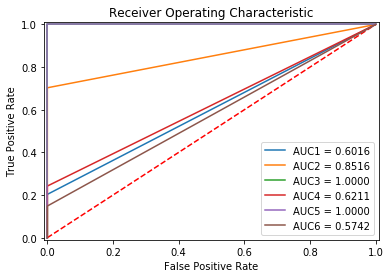

In [96]:
#Métrica
f = plt.figure()
plt.title('Receiver Operating Characteristic')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.plot(List_fpr[0], List_tpr[0], 'tab:blue', label = 'AUC1 = %0.4f' % List_roc_auc[0])
plt.plot(List_fpr[1], List_tpr[1], 'tab:orange', label = 'AUC2 = %0.4f' % List_roc_auc[1])
plt.plot(List_fpr[2], List_tpr[2], 'tab:green', label = 'AUC3 = %0.4f' % List_roc_auc[2])
plt.plot(List_fpr[3], List_tpr[3], 'tab:red', label = 'AUC4 = %0.4f' % List_roc_auc[3])
plt.plot(List_fpr[4], List_tpr[4], 'tab:purple', label = 'AUC5 = %0.4f' % List_roc_auc[4])
plt.plot(List_fpr[5], List_tpr[5], 'tab:brown', label = 'AUC6 = %0.4f' % List_roc_auc[5])
plt.legend(loc = 'lower right')
plt.show()
f.savefig('mx_roc.pdf', bbox_inches='tight')

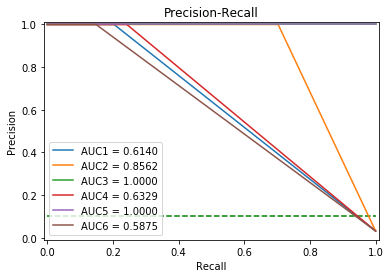

In [98]:
#Métrica
f = plt.figure()
plt.title('Precision-Recall')
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.plot([0, 1], [0.1, 0.1],'g--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.plot(List_recall[0], List_precision[0], 'tab:blue', label = 'AUC1 = %0.4f' % List_pr_auc[0])
plt.plot(List_recall[1], List_precision[1], 'tab:orange', label = 'AUC2 = %0.4f' % List_pr_auc[1])
plt.plot(List_recall[2], List_precision[2], 'tab:green', label = 'AUC3 = %0.4f' % List_pr_auc[2])
plt.plot(List_recall[3], List_precision[3], 'tab:red', label = 'AUC4 = %0.4f' % List_pr_auc[3])
plt.plot(List_recall[4], List_precision[4], 'tab:purple', label = 'AUC5 = %0.4f' % List_pr_auc[4])
plt.plot(List_recall[5], List_precision[5], 'tab:brown', label = 'AUC6 = %0.4f' % List_pr_auc[5])
plt.legend(loc = 'lower left')
plt.show()
f.savefig('mx_pr.pdf', bbox_inches='tight')

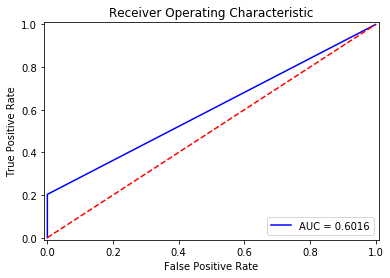

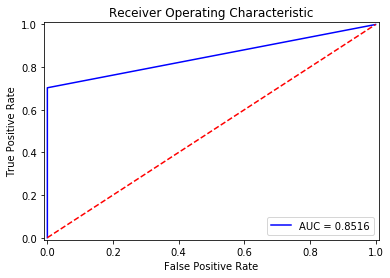

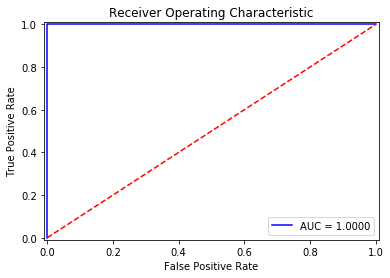

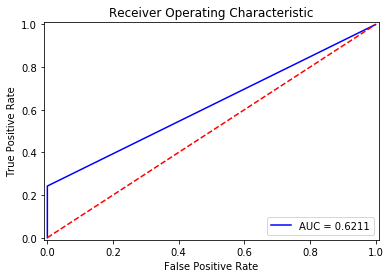

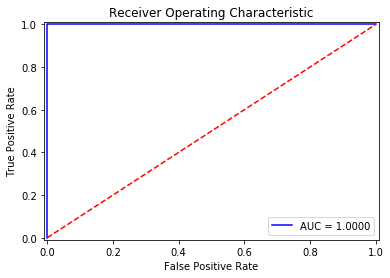

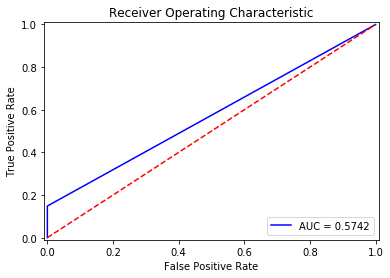

In [69]:
#Métrica
#1. ROC curve
for i in range(6):
    f=plt.figure
    plot_roc_curve(vars()['Array_' + str(i+1) + "_test"],vars()['Array_' + str(i+1) + "_pred"])
    plt.show()

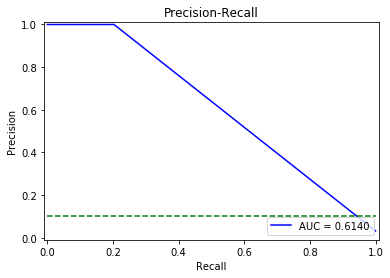

Tarea 1 auc=0.614 ap=0.228


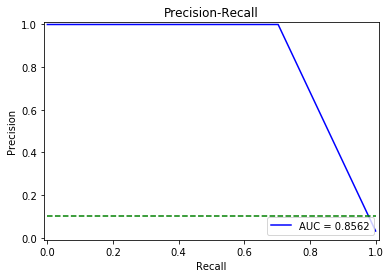

Tarea 2 auc=0.856 ap=0.712


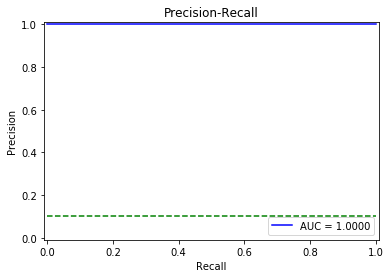

Tarea 3 auc=1.000 ap=1.000


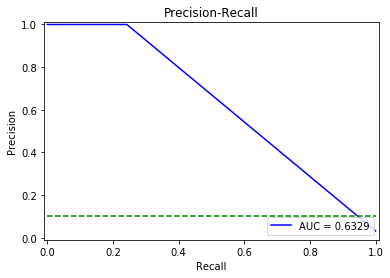

Tarea 4 auc=0.633 ap=0.266


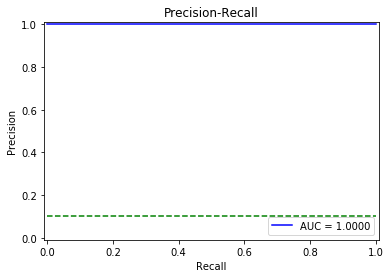

Tarea 5 auc=1.000 ap=1.000


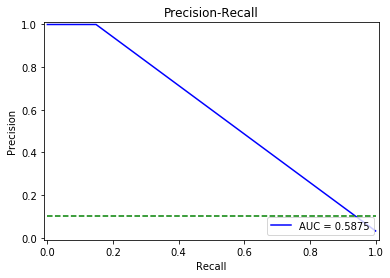

Tarea 6 auc=0.588 ap=0.175


In [82]:
#Métrica
#2. PR curve
for i in range(6):
    f=plt.figure
    precision, recall, thresholds = plot_pr_curve(vars()['Array_' + str(i+1) + "_test"],vars()['Array_' + str(i+1) + "_pred"])
    plt.show()
    # calculate precision-recall AUC
    auc1 = auc(recall, precision)
    # calculate average precision score
    ap = average_precision_score(vars()['Array_' + str(i+1) + "_test"],vars()['Array_' + str(i+1) + "_pred"])
    print('Tarea %d auc=%.3f ap=%.3f' % (i+1,auc1, ap))

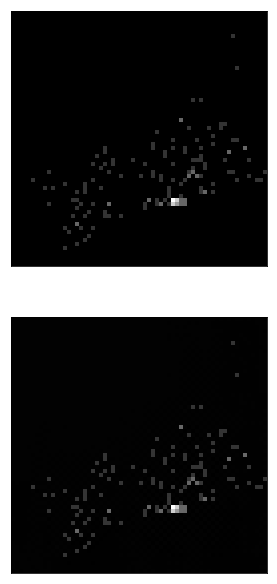

In [126]:
n = 1
plt.figure(figsize=(16, 16))
for i in range(n):
    ax = plt.subplot(3, n, i+1)
    plt.imshow(Y1_test[i].reshape(64, 64))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    ax = plt.subplot(3, n, i+n+1)
    plt.imshow(decoded_grids_1[i].reshape(64, 64))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

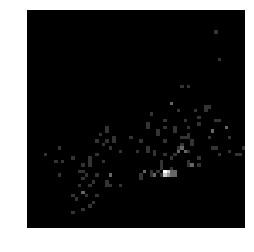

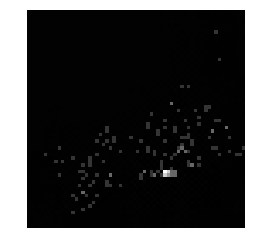

In [137]:
i = 50
f = plt.figure()
plt.imshow(Y1_test[i].reshape(64, 64))
plt.axis('off')
f.savefig("t1i1.pdf", bbox_inches='tight')

f = plt.figure()
plt.imshow(decoded_grids_1[i].reshape(64, 64))
plt.axis('off')
f.savefig("t1i2.pdf", bbox_inches='tight')

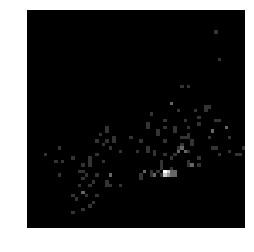

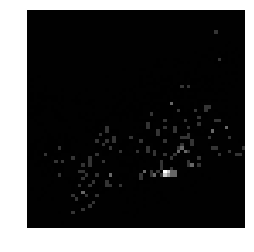

In [138]:
i = 50
f = plt.figure()
plt.imshow(Y2_test[i].reshape(64, 64))
plt.axis('off')
f.savefig("t2i1.pdf", bbox_inches='tight')

f = plt.figure()
plt.imshow(decoded_grids_2[i].reshape(64, 64))
plt.axis('off')
f.savefig("t2i2.pdf", bbox_inches='tight')

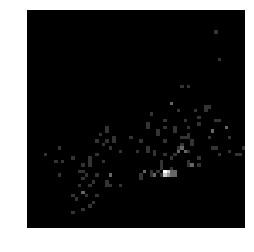

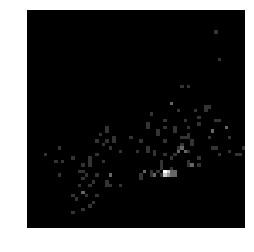

In [140]:
i = 50
f = plt.figure()
plt.imshow(Y3_test_h[i].reshape(64, 64))
plt.axis('off')
f.savefig("t3i1.pdf", bbox_inches='tight')

f = plt.figure()
plt.imshow(decoded_grids_3[i].reshape(64, 64))
plt.axis('off')
f.savefig("t3i2.pdf", bbox_inches='tight')

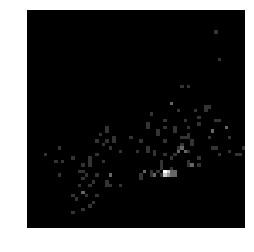

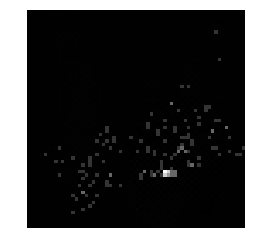

In [141]:
i = 50
f = plt.figure()
plt.imshow(Y4_test[i].reshape(64, 64))
plt.axis('off')
f.savefig("t4i1.pdf", bbox_inches='tight')

f = plt.figure()
plt.imshow(decoded_grids_4[i].reshape(64, 64))
plt.axis('off')
f.savefig("t4i2.pdf", bbox_inches='tight')

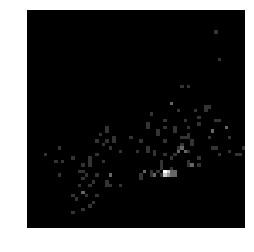

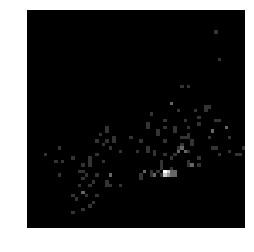

In [142]:
i = 50
f = plt.figure()
plt.imshow(Y5_test[i].reshape(64, 64))
plt.axis('off')
f.savefig("t5i1.pdf", bbox_inches='tight')

f = plt.figure()
plt.imshow(decoded_grids_5[i].reshape(64, 64))
plt.axis('off')
f.savefig("t5i2.pdf", bbox_inches='tight')

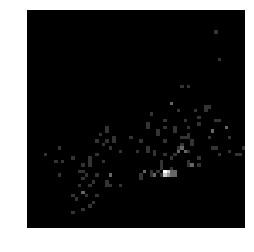

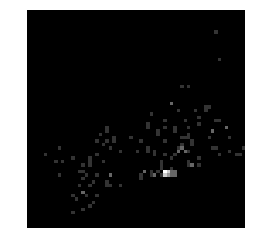

In [143]:
i = 50
f = plt.figure()
plt.imshow(Y6_test[i].reshape(64, 64))
plt.axis('off')
f.savefig("t6i1.pdf", bbox_inches='tight')

f = plt.figure()
plt.imshow(decoded_grids_6[i].reshape(64, 64))
plt.axis('off')
f.savefig("t6i2.pdf", bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


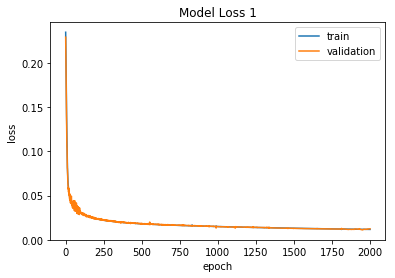

In [144]:
print(history_1.history.keys())
f = plt.figure()
plt.plot(history_1.history['loss'])
plt.plot(history_1.history['val_loss'])
plt.title('Model Loss 1')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m1a.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


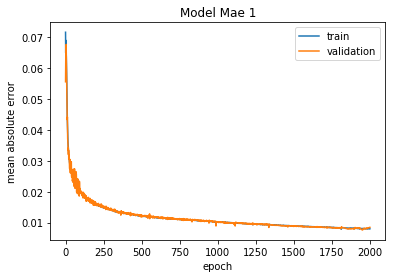

In [149]:
print(history_1.history.keys())
f = plt.figure()
plt.plot(history_1.history['mean_absolute_error'])
plt.plot(history_1.history['val_mean_absolute_error'])
plt.title('Model Mae 1')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m1b.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


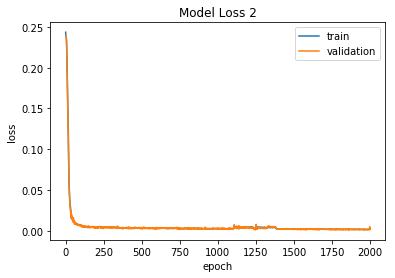

In [146]:
print(history_2.history.keys())
f = plt.figure()
plt.plot(history_2.history['loss'])
plt.plot(history_2.history['val_loss'])
plt.title('Model Loss 2')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m2a.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


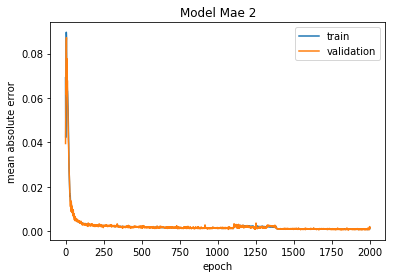

In [150]:
print(history_2.history.keys())
f = plt.figure()
plt.plot(history_2.history['mean_absolute_error'])
plt.plot(history_2.history['val_mean_absolute_error'])
plt.title('Model Mae 2')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m2b.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


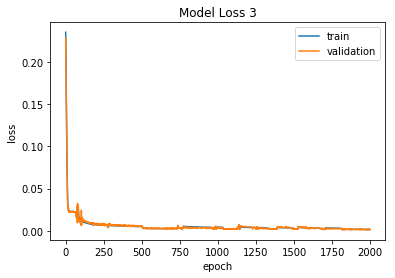

In [148]:
print(history_3_h_6x6.history.keys())
f = plt.figure()
plt.plot(history_3_h_6x6.history['loss'])
plt.plot(history_3_h_6x6.history['val_loss'])
plt.title('Model Loss 3')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m3a.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


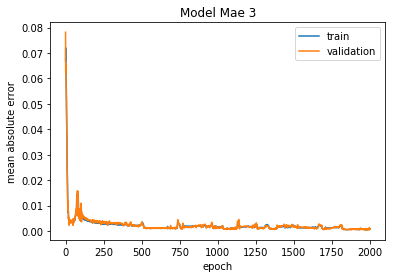

In [151]:
print(history_3_h_6x6.history.keys())
f = plt.figure()
plt.plot(history_3_h_6x6.history['mean_absolute_error'])
plt.plot(history_3_h_6x6.history['val_mean_absolute_error'])
plt.title('Model Mae 3')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m3b.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


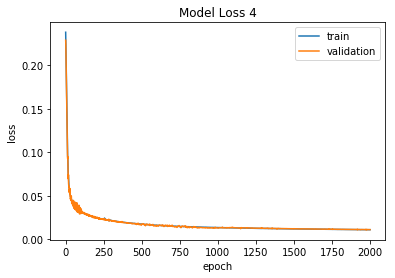

In [152]:
print(history_4.history.keys())
f = plt.figure()
plt.plot(history_4.history['loss'])
plt.plot(history_4.history['val_loss'])
plt.title('Model Loss 4')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m4a.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


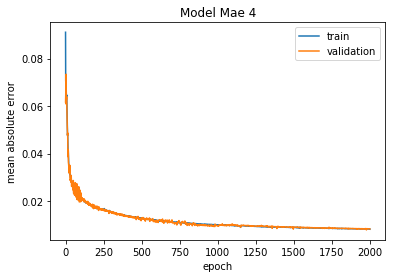

In [153]:
print(history_4.history.keys())
f = plt.figure()
plt.plot(history_4.history['mean_absolute_error'])
plt.plot(history_4.history['val_mean_absolute_error'])
plt.title('Model Mae 4')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m4b.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


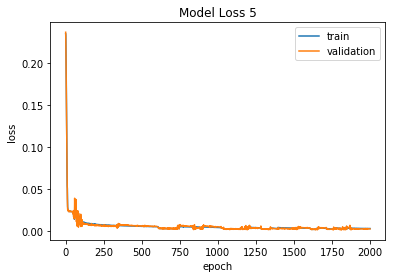

In [154]:
print(history_5.history.keys())
f = plt.figure()
plt.plot(history_5.history['loss'])
plt.plot(history_5.history['val_loss'])
plt.title('Model Loss 5')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m5a.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


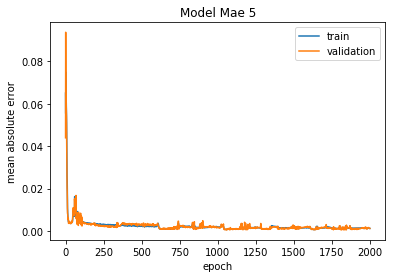

In [155]:
print(history_5.history.keys())
f = plt.figure()
plt.plot(history_5.history['mean_absolute_error'])
plt.plot(history_5.history['val_mean_absolute_error'])
plt.title('Model Mae 5')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m5b.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


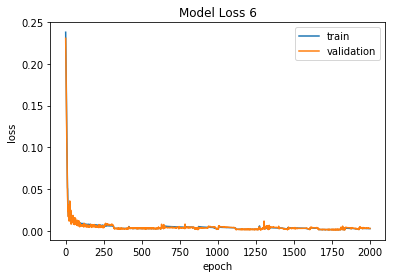

In [156]:
print(history_6.history.keys())
f = plt.figure()
plt.plot(history_6.history['loss'])
plt.plot(history_6.history['val_loss'])
plt.title('Model Loss 6')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m6a.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'val_mean_absolute_percentage_error', 'val_mean_absolute_error', 'loss', 'coeff_determination', 'mean_absolute_percentage_error', 'mean_absolute_error'])


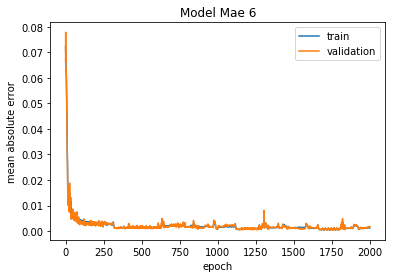

In [157]:
print(history_6.history.keys())
f = plt.figure()
plt.plot(history_6.history['mean_absolute_error'])
plt.plot(history_6.history['val_mean_absolute_error'])
plt.title('Model Mae 6')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
f.savefig('m6b.pdf', bbox_inches='tight')

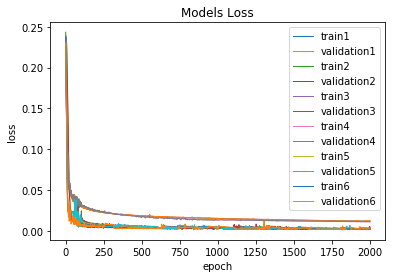

In [158]:
f = plt.figure()
plt.plot(history_1.history['loss'], linewidth=1)
plt.plot(history_1.history['val_loss'], linewidth=1)
plt.plot(history_2.history['loss'], linewidth=1)
plt.plot(history_2.history['val_loss'], linewidth=1)
plt.plot(history_3_h_6x6.history['loss'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_loss'], linewidth=1)
plt.plot(history_4.history['loss'], linewidth=1)
plt.plot(history_4.history['val_loss'], linewidth=1)
plt.plot(history_5.history['loss'], linewidth=1)
plt.plot(history_5.history['val_loss'], linewidth=1)
plt.plot(history_6.history['loss'], linewidth=1)
plt.plot(history_6.history['val_loss'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train1', 'validation1','train2', 'validation2','train3', 'validation3','train4', 'validation4','train5', 'validation5','train6', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_contodo_loss.pdf', bbox_inches='tight')

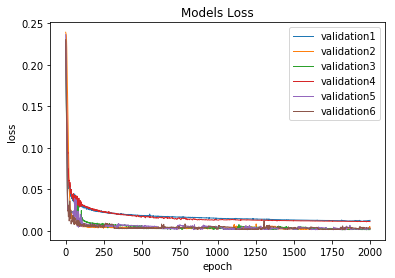

In [159]:
f = plt.figure()
plt.plot(history_1.history['val_loss'], linewidth=1)
plt.plot(history_2.history['val_loss'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_loss'], linewidth=1)
plt.plot(history_4.history['val_loss'], linewidth=1)
plt.plot(history_5.history['val_loss'], linewidth=1)
plt.plot(history_6.history['val_loss'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['validation1', 'validation2', 'validation3', 'validation4', 'validation5', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_val_loss.pdf', bbox_inches='tight')

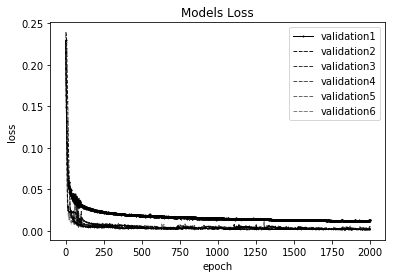

In [213]:
f = plt.figure()
plt.plot(history_1.history['val_loss'], linewidth=1, linestyle='solid', marker='o', markersize=1,color= (0, 0, 0, 1))
plt.plot(history_2.history['val_loss'], linewidth=1, linestyle='--', marker='v', markersize=0.1,color= (0, 0, 0, 0.9))
plt.plot(history_3_h_6x6.history['val_loss'], linewidth=1, linestyle='--', marker='<', markersize=0.1,color= (0, 0, 0, 0.8))
plt.plot(history_4.history['val_loss'], linewidth=1, linestyle='--', marker='*', markersize=0.1,color= (0, 0, 0, 0.7))
plt.plot(history_5.history['val_loss'], linewidth=1, linestyle='--', marker='h', markersize=0.1,color= (0, 0, 0, 0.6))
plt.plot(history_6.history['val_loss'], linewidth=1, linestyle='--', marker='d', markersize=0.1,color= (0, 0, 0, 0.5))
plt.title('Models Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['validation1', 'validation2', 'validation3', 'validation4', 'validation5', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_val_loss_paper.pdf', bbox_inches='tight')

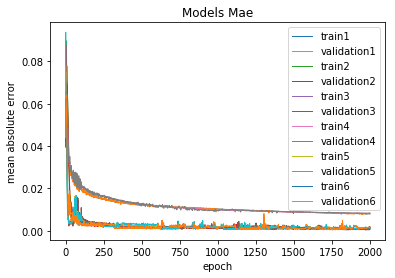

In [179]:
f = plt.figure()
plt.plot(history_1.history['mean_absolute_error'], linewidth=1)
plt.plot(history_1.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_2.history['mean_absolute_error'], linewidth=1)
plt.plot(history_2.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_3_h_6x6.history['mean_absolute_error'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_4.history['mean_absolute_error'], linewidth=1)
plt.plot(history_4.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_5.history['mean_absolute_error'], linewidth=1)
plt.plot(history_5.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_6.history['mean_absolute_error'], linewidth=1)
plt.plot(history_6.history['val_mean_absolute_error'], linewidth=1)
plt.title('Models Mae')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['train1', 'validation1','train2', 'validation2','train3', 'validation3','train4', 'validation4','train5', 'validation5','train6', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_contodo_mae.pdf', bbox_inches='tight')

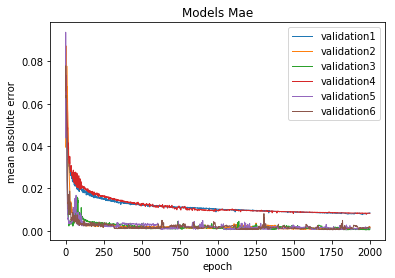

In [180]:
f = plt.figure()
plt.plot(history_1.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_2.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_4.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_5.history['val_mean_absolute_error'], linewidth=1)
plt.plot(history_6.history['val_mean_absolute_error'], linewidth=1)
plt.title('Models Mae')
plt.ylabel('mean absolute error')
plt.xlabel('epoch')
plt.legend(['validation1', 'validation2', 'validation3', 'validation4', 'validation5', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_val_mae.pdf', bbox_inches='tight')

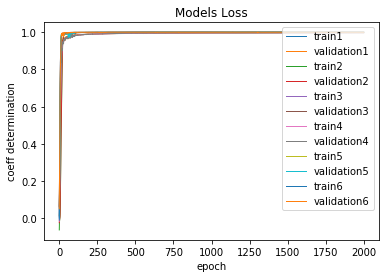

In [181]:
f = plt.figure()
plt.plot(history_1.history['coeff_determination'], linewidth=1)
plt.plot(history_1.history['val_coeff_determination'], linewidth=1)
plt.plot(history_2.history['coeff_determination'], linewidth=1)
plt.plot(history_2.history['val_coeff_determination'], linewidth=1)
plt.plot(history_3_h_6x6.history['coeff_determination'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_coeff_determination'], linewidth=1)
plt.plot(history_4.history['coeff_determination'], linewidth=1)
plt.plot(history_4.history['val_coeff_determination'], linewidth=1)
plt.plot(history_5.history['coeff_determination'], linewidth=1)
plt.plot(history_5.history['val_coeff_determination'], linewidth=1)
plt.plot(history_6.history['coeff_determination'], linewidth=1)
plt.plot(history_6.history['val_coeff_determination'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('coeff determination')
plt.xlabel('epoch')
plt.legend(['train1', 'validation1','train2', 'validation2','train3', 'validation3','train4', 'validation4','train5', 'validation5','train6', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_contodo_r2.pdf', bbox_inches='tight')

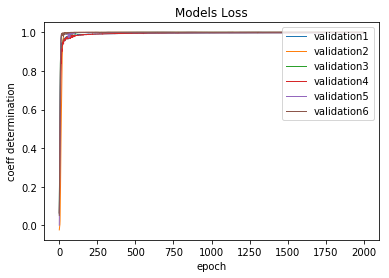

In [182]:
f = plt.figure()
plt.plot(history_1.history['val_coeff_determination'], linewidth=1)
plt.plot(history_2.history['val_coeff_determination'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_coeff_determination'], linewidth=1)
plt.plot(history_4.history['val_coeff_determination'], linewidth=1)
plt.plot(history_5.history['val_coeff_determination'], linewidth=1)
plt.plot(history_6.history['val_coeff_determination'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('coeff determination')
plt.xlabel('epoch')
plt.legend(['validation1', 'validation2', 'validation3', 'validation4', 'validation5', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_val_r2.pdf', bbox_inches='tight')

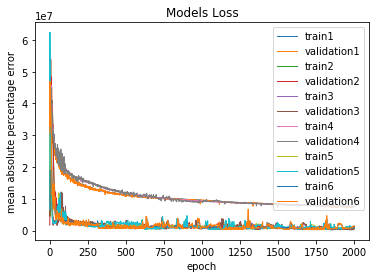

In [183]:
f = plt.figure()
plt.plot(history_1.history['mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_1.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_2.history['mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_2.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_3_h_6x6.history['mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_4.history['mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_4.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_5.history['mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_5.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_6.history['mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_6.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('mean absolute percentage error')
plt.xlabel('epoch')
plt.legend(['train1', 'validation1','train2', 'validation2','train3', 'validation3','train4', 'validation4','train5', 'validation5','train6', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_contodo_MAPE.pdf', bbox_inches='tight')

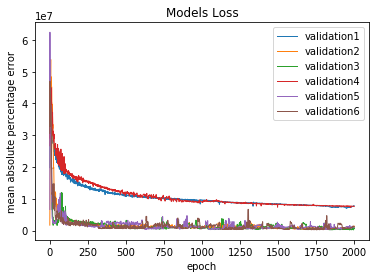

In [184]:
f = plt.figure()
plt.plot(history_1.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_2.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_3_h_6x6.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_4.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_5.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.plot(history_6.history['val_mean_absolute_percentage_error'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('mean absolute percentage error')
plt.xlabel('epoch')
plt.legend(['validation1', 'validation2', 'validation3', 'validation4', 'validation5', 'validation6'], loc='upper right')
plt.show()
f.savefig('mx_val_MAPE.pdf', bbox_inches='tight')

<h5><center>INICIO DE PRUEBAS</center></h5>

In [11]:
#Métrica
import pickle
pickle_in = open("decoded_grids_1.pickle","rb")
decoded_grids_1 = pickle.load(pickle_in)
pickle_in = open("decoded_grids_2.pickle","rb")
decoded_grids_2 = pickle.load(pickle_in)
pickle_in = open("decoded_grids_3.pickle","rb")
decoded_grids_3 = pickle.load(pickle_in)
pickle_in = open("decoded_grids_4.pickle","rb")
decoded_grids_4 = pickle.load(pickle_in)
pickle_in = open("decoded_grids_5.pickle","rb")
decoded_grids_5 = pickle.load(pickle_in)
pickle_in = open("decoded_grids_6.pickle","rb")
decoded_grids_6 = pickle.load(pickle_in)

In [135]:
#PROBANDO guardar variables con pickle
import pickle
pickle_out = open("history_1.pickle","wb")
pickle.dump(history_1,pickle_out)
pickle_out.close()
pickle_out = open("history_2.pickle","wb")
pickle.dump(history_2,pickle_out)
pickle_out.close()
pickle_out = open("history_3_h_6x6.pickle","wb")
pickle.dump(history_3_h_6x6,pickle_out)
pickle_out.close()
pickle_out = open("history_4.pickle","wb")
pickle.dump(history_4,pickle_out)
pickle_out.close()
pickle_out = open("history_5.pickle","wb")
pickle.dump(history_5,pickle_out)
pickle_out.close()
pickle_out = open("history_6.pickle","wb")
pickle.dump(history_6,pickle_out)
pickle_out.close()

In [136]:
#PROBANDO guardar los modelos
autoencoder1.save("autoencoder1.h5")
autoencoder2.save("autoencoder2.h5")
autoencoder3_h_6x6.save("autoencoder3_h_6x6.h5")
autoencoder4.save("autoencoder4.h5")
autoencoder5.save("autoencoder5.h5")
autoencoder6.save("autoencoder6.h5")

In [ ]:
#PROBANDO código para calcular recall score
from sklearn.metrics import recall_score
m1 = np.squeeze(np.asarray(Y5_test[1])).flatten()
m2 = np.squeeze(np.asarray(decoded_grids_5[1])).flatten()
print(recall_score(m1, m2, average='micro'))

In [54]:
#PROBANDO código para guardar imagen del modelo con capas
from keras.utils.vis_utils import plot_model
plot_model(autoencoder1, to_file='autoencoder1.pdf',show_shapes=True, show_layer_names=True)

In [124]:
#PROBANDO
decoded_grids_1 = autoencoder1.predict(X1_test)
decoded_grids_2 = autoencoder2.predict(X2_test)
decoded_grids_3 = autoencoder3_h_6x6.predict(X3_test_h)
decoded_grids_4 = autoencoder4.predict(X4_test)
decoded_grids_5 = autoencoder5.predict(X5_test)
decoded_grids_6 = autoencoder6.predict(X6_test)
import pickle
pickle_out = open("decoded_grids_1.pickle","wb")
pickle.dump(decoded_grids_1,pickle_out)
pickle_out.close()
pickle_out = open("decoded_grids_2.pickle","wb")
pickle.dump(decoded_grids_2,pickle_out)
pickle_out.close()
pickle_out = open("decoded_grids_3.pickle","wb")
pickle.dump(decoded_grids_3,pickle_out)
pickle_out.close()
pickle_out = open("decoded_grids_4.pickle","wb")
pickle.dump(decoded_grids_4,pickle_out)
pickle_out.close()
pickle_out = open("decoded_grids_5.pickle","wb")
pickle.dump(decoded_grids_5,pickle_out)
pickle_out.close()
pickle_out = open("decoded_grids_6.pickle","wb")
pickle.dump(decoded_grids_6,pickle_out)
pickle_out.close()

In [125]:
#PROBANDO
tot = 64*64
neq = np.zeros((6), dtype=int)
ntrue = np.zeros((6), dtype=int)
nfalse = np.zeros((6), dtype=int)
k = 50
for i in range(64):
    for j in range(64):
        #Autoencoder1
        if decoded_grids_1[k][i][j] == Y1_test[k][i][j]:
            neq[0] += 1
        if decoded_grids_1[k][i][j] > 0 and Y1_test[k][i][j] > 0:
            ntrue[0] += 1
        if decoded_grids_1[k][i][j] <= 0 and Y1_test[k][i][j] <= 0:
            nfalse[0] += 1
        #Autoencoder2
        if decoded_grids_2[k][i][j] == Y2_test[k][i][j]:
            neq[1] += 1
        if decoded_grids_2[k][i][j] > 0 and Y2_test[k][i][j] > 0:
            ntrue[1] += 1
        if decoded_grids_2[k][i][j] <= 0 and Y2_test[k][i][j] <= 0:
            nfalse[1] += 1
        #Autoencoder3
        if decoded_grids_3[k][i][j] == Y3_test_h[k][i][j]:
            neq[2] += 1
        if decoded_grids_3[k][i][j] > 0 and Y3_test_h[k][i][j] > 0:
            ntrue[2] += 1
        if decoded_grids_3[k][i][j] <= 0 and Y3_test_h[k][i][j] <= 0:
            nfalse[2] += 1
        #Autoencoder4
        if decoded_grids_4[k][i][j] == Y4_test[k][i][j]:
            neq[3] += 1
        if decoded_grids_4[k][i][j] > 0 and Y4_test[k][i][j] > 0:
            ntrue[3] += 1
        if decoded_grids_4[k][i][j] <= 0 and Y4_test[k][i][j] <= 0:
            nfalse[3] += 1
        #Autoencoder5
        if decoded_grids_5[k][i][j] == Y5_test[k][i][j]:
            neq[4] += 1
        if decoded_grids_5[k][i][j] > 0 and Y5_test[k][i][j] > 0:
            ntrue[4] += 1
        if decoded_grids_5[k][i][j] <= 0 and Y5_test[k][i][j] <= 0:
            nfalse[4] += 1
        #Autoencoder6
        if decoded_grids_6[k][i][j] == Y6_test[k][i][j]:
            neq[5] += 1
        if decoded_grids_6[k][i][j] > 0 and Y6_test[k][i][j] > 0:
            ntrue[5] += 1
        if decoded_grids_6[k][i][j] <= 0 and Y6_test[k][i][j] <= 0:
            nfalse[5] += 1
for i in range(6):
    print("Autoencoder {}".format(i+1))
    print("Recall entre dos matrices {}".format(ntrue[i]/(ntrue[i]+nfalse[i])))

Autoencoder 1
Número de celdas iguales 0 del total 4096
Recall 0.051696284329563816
Autoencoder 2
Número de celdas iguales 0 del total 4096
Recall 0.043243243243243246
Autoencoder 3
Número de celdas iguales 0 del total 4096
Recall 0.35359116022099446
Autoencoder 4
Número de celdas iguales 0 del total 4096
Recall 0.03785862170955338
Autoencoder 5
Número de celdas iguales 0 del total 4096
Recall 0.3575418994413408
Autoencoder 6
Número de celdas iguales 0 del total 4096
Recall 0.03129584352078239


In [26]:
#PROBANDO
def compare_matrices(m1,m2):
    if (m1.shape[0] == m2.shape[0] and m1.shape[1] == m2.shape[1]):
        equal = 0
        total = m1.shape[0]* m1.shape[1]
        n_it = 0
        for i in range (m1.shape[0]):
            for j in range (m1.shape[1]):
                if (m1[i][j] == m2[i][j]):
                    equal+=1
        print('Celdas iguales = ', equal, 'Celdas totales = ',total)
    else:
        print('Las dimensiones de las matrices son diferentes')

In [2]:
#PROBANDO código para cargar un modelo guardado en h5
from keras import backend as K
def coeff_determination(y_true,y_pred):
    SS_res = K.sum(K.square(y_true-y_pred))
    SS_tot = K.sum(K.square(y_true-K.mean(y_true)))
    return (1-SS_res/(SS_tot+K.epsilon()))
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
from keras.models import load_model
model = load_model('Modelos/3x6/AE3days3x6_3000epochs.h5',custom_objects={'root_mean_squared_error': root_mean_squared_error, 'coeff_determination':coeff_determination})

Instructions for updating:
Colocations handled automatically by placer.


In [15]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, ZeroPadding2D
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D
input_nn = Input(shape=X3_training_v.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(conv2_3)

autoencoder3_v = Model(inputs=input_nn, outputs=output_nn)
autoencoder3_v.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder3_v.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 128, 128, 1)       0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 128, 128, 16)      160       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 64, 64, 16)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 64, 64, 8)         1160      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 32, 32, 8)         0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 32, 32, 8)         584       
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 16, 16, 8)         0         
__________

In [16]:
#PROBANDO
epochs = 1000
batch_size = 32
history_3_v = autoencoder3_v.fit(X3_training_v, Y3_training_v, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X3_test_v,Y3_test_v))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2375 - coeff_determination: -8.2450e-03 - mean_absolute_percentage_error: 37201651.1373 - mean_absolute_error: 0.0738 - val_loss: 0.2358 - val_coeff_determination: 0.0064 - val_mean_absolute_percentage_error: 35062616.0000 - val_mean_absolute_error: 0.0715
Epoch 2/1000
 - 0s - loss: 0.2354 - coeff_determination: 0.0092 - mean_absolute_percentage_error: 33925202.7608 - mean_absolute_error: 0.0704 - val_loss: 0.2349 - val_coeff_determination: 0.0138 - val_mean_absolute_percentage_error: 41219576.0000 - val_mean_absolute_error: 0.0773
Epoch 3/1000
 - 0s - loss: 0.2344 - coeff_determination: 0.0178 - mean_absolute_percentage_error: 40723708.6118 - mean_absolute_error: 0.0768 - val_loss: 0.2337 - val_coeff_determination: 0.0236 - val_mean_absolute_percentage_error: 36725248.0000 - val_mean_absolute_error: 0.0728
Epoch 4/1000
 - 0s - loss: 0.2329 - coeff_determination: 0.0300 - mean_absolute_percentage_error: 39419680

In [17]:
#PROBANDO
autoencoder3_v.save("autoencoder3_v_1000epochs.h5")

In [94]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, Dropout
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D = Dropout(rate=0.1)(pool1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(D)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1_wdor1 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_wdor1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_128 (Conv2D)          (None, 64, 64, 16)        160       
_________________________________________________________________
max_pooling2d_58 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_129 (Conv2D)          (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_59 (MaxPooling (None, 16, 16, 8)         0         
_________________________________________________________________
conv2d_130 (Conv2D)          (None, 16, 16, 8)         584       
__________

In [93]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, Dropout
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D = Dropout(rate=0.2)(pool1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(D)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1_wdor2 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_wdor2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_121 (Conv2D)          (None, 64, 64, 16)        160       
_________________________________________________________________
max_pooling2d_55 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_122 (Conv2D)          (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_56 (MaxPooling (None, 16, 16, 8)         0         
_________________________________________________________________
conv2d_123 (Conv2D)          (None, 16, 16, 8)         584       
__________

In [95]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, Dropout
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D = Dropout(rate=0.3)(pool1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(D)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1_wdor3 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_wdor3.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_135 (Conv2D)          (None, 64, 64, 16)        160       
_________________________________________________________________
max_pooling2d_61 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_136 (Conv2D)          (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_62 (MaxPooling (None, 16, 16, 8)         0         
_________________________________________________________________
conv2d_137 (Conv2D)          (None, 16, 16, 8)         584       
__________

In [96]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, Dropout
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D = Dropout(rate=0.4)(pool1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(D)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1_wdor4 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_wdor4.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_142 (Conv2D)          (None, 64, 64, 16)        160       
_________________________________________________________________
max_pooling2d_64 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_143 (Conv2D)          (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_65 (MaxPooling (None, 16, 16, 8)         0         
_________________________________________________________________
conv2d_144 (Conv2D)          (None, 16, 16, 8)         584       
__________

In [97]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, Dropout
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D = Dropout(rate=0.5)(pool1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(D)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1_wdor5 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_wdor5.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_149 (Conv2D)          (None, 64, 64, 16)        160       
_________________________________________________________________
max_pooling2d_67 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_150 (Conv2D)          (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_68 (MaxPooling (None, 16, 16, 8)         0         
_________________________________________________________________
conv2d_151 (Conv2D)          (None, 16, 16, 8)         584       
__________

In [98]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add, Dropout
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D1 = Dropout(rate=0.2)(pool1)
conv1_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(D1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
D2 = Dropout(rate=0.2)(pool2)
conv1_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(D2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(8, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1_wdo2 = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_wdo2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_24 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_156 (Conv2D)          (None, 64, 64, 16)        160       
_________________________________________________________________
max_pooling2d_70 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_157 (Conv2D)          (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_71 (MaxPooling (None, 16, 16, 8)         0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 16, 16, 8)         0         
__________

In [99]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(8, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(4, (3, 3), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(4, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)

# Decoder
conv2_1 = Conv2D(4, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(4, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(8, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1b = Model(inputs=input_nn, outputs=output_nn)
autoencoder1b.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_163 (Conv2D)          (None, 64, 64, 8)         80        
_________________________________________________________________
max_pooling2d_73 (MaxPooling (None, 32, 32, 8)         0         
_________________________________________________________________
conv2d_164 (Conv2D)          (None, 32, 32, 4)         292       
_________________________________________________________________
max_pooling2d_74 (MaxPooling (None, 16, 16, 4)         0         
_________________________________________________________________
conv2d_165 (Conv2D)          (None, 16, 16, 4)         148       
_________________________________________________________________
max_pooling2d_75 (MaxPooling (None, 8, 8, 4)           0         
__________

In [100]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(32, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(16, (3, 3), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(16, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(16, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(32, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1c = Model(inputs=input_nn, outputs=output_nn)
autoencoder1c.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_170 (Conv2D)          (None, 64, 64, 32)        320       
_________________________________________________________________
max_pooling2d_76 (MaxPooling (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_171 (Conv2D)          (None, 32, 32, 16)        4624      
_________________________________________________________________
max_pooling2d_77 (MaxPooling (None, 16, 16, 16)        0         
_________________________________________________________________
conv2d_172 (Conv2D)          (None, 16, 16, 16)        2320      
_________________________________________________________________
max_pooling2d_78 (MaxPooling (None, 8, 8, 16)          0         
__________

In [101]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
conv1_2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
conv1_3 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(32, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
conv2_2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
up2 = UpSampling2D((2, 2))(conv2_2)
conv2_3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up2)
up3 = UpSampling2D((2, 2))(conv2_3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(up3)

autoencoder1d = Model(inputs=input_nn, outputs=output_nn)
autoencoder1d.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_177 (Conv2D)          (None, 64, 64, 64)        640       
_________________________________________________________________
max_pooling2d_79 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_178 (Conv2D)          (None, 32, 32, 32)        18464     
_________________________________________________________________
max_pooling2d_80 (MaxPooling (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_179 (Conv2D)          (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_81 (MaxPooling (None, 8, 8, 32)          0         
__________

In [12]:
#PROBANDO
from keras import backend as K
def coeff_determination(y_true,y_pred):
    SS_res = K.sum(K.square(y_true-y_pred))
    SS_tot = K.sum(K.square(y_true-K.mean(y_true)))
    return (1-SS_res/(SS_tot+K.epsilon()))
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [ ]:
#PROBANDO
autoencoder1.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1_wdor1.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1_wdor2.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1_wdor3.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1_wdor4.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1_wdor5.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1_wdo2.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1b.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1c.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
autoencoder1d.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])

In [103]:
#PROBANDO
epochs = 1000
batch_size = 32
history_1 = autoencoder1.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 2s - loss: 0.2285 - coeff_determination: 0.0665 - mean_absolute_percentage_error: 45090447.3255 - mean_absolute_error: 0.0790 - val_loss: 0.2235 - val_coeff_determination: 0.1067 - val_mean_absolute_percentage_error: 36191465.5273 - val_mean_absolute_error: 0.0698
Epoch 2/1000
 - 1s - loss: 0.2206 - coeff_determination: 0.1298 - mean_absolute_percentage_error: 38567661.5216 - mean_absolute_error: 0.0712 - val_loss: 0.2174 - val_coeff_determination: 0.1554 - val_mean_absolute_percentage_error: 44234064.5091 - val_mean_absolute_error: 0.0754
Epoch 3/1000
 - 1s - loss: 0.2143 - coeff_determination: 0.1787 - mean_absolute_percentage_error: 40538550.5569 - mean_absolute_error: 0.0717 - val_loss: 0.2101 - val_coeff_determination: 0.2107 - val_mean_absolute_percentage_error: 39627768.5091 - val_mean_absolute_error: 0.0701
Epoch 4/1000
 - 1s - loss: 0.2065 - coeff_determination: 0.2374 - mean_absolute_percentage_error: 39503311.2471

In [44]:
#PROBANDO con convoluciones 6x6, maxpooling 4x4, y 64/32 neuronas
autoencoder1.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
epochs = 1000
batch_size = 32
history_1 = autoencoder1.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2367 - coeff_determination: -1.4798e-03 - mean_absolute_percentage_error: 32461100.6118 - mean_absolute_error: 0.0689 - val_loss: 0.2337 - val_coeff_determination: 0.0234 - val_mean_absolute_percentage_error: 55656187.4909 - val_mean_absolute_error: 0.0907
Epoch 2/1000
 - 0s - loss: 0.2300 - coeff_determination: 0.0541 - mean_absolute_percentage_error: 44368528.6275 - mean_absolute_error: 0.0789 - val_loss: 0.2268 - val_coeff_determination: 0.0809 - val_mean_absolute_percentage_error: 54959176.5091 - val_mean_absolute_error: 0.0873
Epoch 3/1000
 - 0s - loss: 0.2241 - coeff_determination: 0.1021 - mean_absolute_percentage_error: 44537241.0824 - mean_absolute_error: 0.0775 - val_loss: 0.2208 - val_coeff_determination: 0.1286 - val_mean_absolute_percentage_error: 48237632.5091 - val_mean_absolute_error: 0.0800
Epoch 4/1000
 - 0s - loss: 0.2173 - coeff_determination: 0.1556 - mean_absolute_percentage_error: 46305576

In [46]:
#PROBANDO con convoluciones 6x6, maxpooling 2x2, y 64/32 neuronas
autoencoder1.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])
epochs = 1000
batch_size = 32
history_1 = autoencoder1.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2476 - coeff_determination: -1.0983e-01 - mean_absolute_percentage_error: 34430498.6902 - mean_absolute_error: 0.0703 - val_loss: 0.2342 - val_coeff_determination: 0.0193 - val_mean_absolute_percentage_error: 22732710.5091 - val_mean_absolute_error: 0.0592
Epoch 2/1000
 - 0s - loss: 0.2293 - coeff_determination: 0.0598 - mean_absolute_percentage_error: 42164891.0118 - mean_absolute_error: 0.0764 - val_loss: 0.2247 - val_coeff_determination: 0.0975 - val_mean_absolute_percentage_error: 37529716.5091 - val_mean_absolute_error: 0.0711
Epoch 3/1000
 - 0s - loss: 0.2223 - coeff_determination: 0.1166 - mean_absolute_percentage_error: 38597572.8941 - mean_absolute_error: 0.0715 - val_loss: 0.2178 - val_coeff_determination: 0.1518 - val_mean_absolute_percentage_error: 38918385.0182 - val_mean_absolute_error: 0.0707
Epoch 4/1000
 - 0s - loss: 0.2141 - coeff_determination: 0.1806 - mean_absolute_percentage_error: 41759673

In [104]:
#PROBANDO
history_1_wdor1 = autoencoder1_wdor1.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2317 - coeff_determination: 0.0399 - mean_absolute_percentage_error: 38730288.5020 - mean_absolute_error: 0.0738 - val_loss: 0.2276 - val_coeff_determination: 0.0736 - val_mean_absolute_percentage_error: 35997761.0182 - val_mean_absolute_error: 0.0705
Epoch 2/1000
 - 1s - loss: 0.2247 - coeff_determination: 0.0974 - mean_absolute_percentage_error: 41822370.1804 - mean_absolute_error: 0.0752 - val_loss: 0.2201 - val_coeff_determination: 0.1343 - val_mean_absolute_percentage_error: 39825432.5091 - val_mean_absolute_error: 0.0726
Epoch 3/1000
 - 1s - loss: 0.2174 - coeff_determination: 0.1548 - mean_absolute_percentage_error: 42361393.4745 - mean_absolute_error: 0.0742 - val_loss: 0.2129 - val_coeff_determination: 0.1896 - val_mean_absolute_percentage_error: 38748760.5091 - val_mean_absolute_error: 0.0700
Epoch 4/1000
 - 1s - loss: 0.2107 - coeff_determination: 0.2063 - mean_absolute_percentage_error: 40977416.9255

In [105]:
#PROBANDO
history_1_wdor2 = autoencoder1_wdor2.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2308 - coeff_determination: 0.0476 - mean_absolute_percentage_error: 41641505.4588 - mean_absolute_error: 0.0765 - val_loss: 0.2278 - val_coeff_determination: 0.0722 - val_mean_absolute_percentage_error: 33941623.4909 - val_mean_absolute_error: 0.0687
Epoch 2/1000
 - 1s - loss: 0.2254 - coeff_determination: 0.0915 - mean_absolute_percentage_error: 45498931.0745 - mean_absolute_error: 0.0789 - val_loss: 0.2226 - val_coeff_determination: 0.1145 - val_mean_absolute_percentage_error: 40254564.0000 - val_mean_absolute_error: 0.0737
Epoch 3/1000
 - 1s - loss: 0.2203 - coeff_determination: 0.1323 - mean_absolute_percentage_error: 46095238.7294 - mean_absolute_error: 0.0784 - val_loss: 0.2169 - val_coeff_determination: 0.1590 - val_mean_absolute_percentage_error: 35855703.4909 - val_mean_absolute_error: 0.0684
Epoch 4/1000
 - 1s - loss: 0.2145 - coeff_determination: 0.1777 - mean_absolute_percentage_error: 44153936.9098

In [106]:
#PROBANDO
history_1_wdor3 = autoencoder1_wdor3.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2430 - coeff_determination: -5.6314e-02 - mean_absolute_percentage_error: 13012411.7961 - mean_absolute_error: 0.0513 - val_loss: 0.2379 - val_coeff_determination: -1.1314e-02 - val_mean_absolute_percentage_error: 13333143.0000 - val_mean_absolute_error: 0.0507
Epoch 2/1000
 - 1s - loss: 0.2366 - coeff_determination: -6.3667e-04 - mean_absolute_percentage_error: 23682292.5020 - mean_absolute_error: 0.0607 - val_loss: 0.2354 - val_coeff_determination: 0.0095 - val_mean_absolute_percentage_error: 37716648.0000 - val_mean_absolute_error: 0.0741
Epoch 3/1000
 - 1s - loss: 0.2340 - coeff_determination: 0.0211 - mean_absolute_percentage_error: 52960154.4314 - mean_absolute_error: 0.0883 - val_loss: 0.2322 - val_coeff_determination: 0.0363 - val_mean_absolute_percentage_error: 55846928.5091 - val_mean_absolute_error: 0.0906
Epoch 4/1000
 - 1s - loss: 0.2302 - coeff_determination: 0.0524 - mean_absolute_percentage_error

In [107]:
#PROBANDO
history_1_wdor4 = autoencoder1_wdor4.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2372 - coeff_determination: -6.0440e-03 - mean_absolute_percentage_error: 33322548.3765 - mean_absolute_error: 0.0698 - val_loss: 0.2316 - val_coeff_determination: 0.0410 - val_mean_absolute_percentage_error: 43163907.4909 - val_mean_absolute_error: 0.0783
Epoch 2/1000
 - 1s - loss: 0.2296 - coeff_determination: 0.0573 - mean_absolute_percentage_error: 51264554.0392 - mean_absolute_error: 0.0852 - val_loss: 0.2270 - val_coeff_determination: 0.0787 - val_mean_absolute_percentage_error: 28701346.0000 - val_mean_absolute_error: 0.0635
Epoch 3/1000
 - 1s - loss: 0.2239 - coeff_determination: 0.1036 - mean_absolute_percentage_error: 37513866.3529 - mean_absolute_error: 0.0705 - val_loss: 0.2216 - val_coeff_determination: 0.1220 - val_mean_absolute_percentage_error: 30080716.0000 - val_mean_absolute_error: 0.0632
Epoch 4/1000
 - 1s - loss: 0.2203 - coeff_determination: 0.1324 - mean_absolute_percentage_error: 36194923

In [108]:
#PROBANDO
history_1_wdor5 = autoencoder1_wdor5.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2306 - coeff_determination: 0.0496 - mean_absolute_percentage_error: 37053253.8745 - mean_absolute_error: 0.0716 - val_loss: 0.2312 - val_coeff_determination: 0.0444 - val_mean_absolute_percentage_error: 16180551.8727 - val_mean_absolute_error: 0.0523
Epoch 2/1000
 - 1s - loss: 0.2264 - coeff_determination: 0.0839 - mean_absolute_percentage_error: 45780524.0157 - mean_absolute_error: 0.0788 - val_loss: 0.2288 - val_coeff_determination: 0.0641 - val_mean_absolute_percentage_error: 15319314.8727 - val_mean_absolute_error: 0.0511
Epoch 3/1000
 - 1s - loss: 0.2222 - coeff_determination: 0.1174 - mean_absolute_percentage_error: 35985730.3373 - mean_absolute_error: 0.0690 - val_loss: 0.2220 - val_coeff_determination: 0.1194 - val_mean_absolute_percentage_error: 21726840.5091 - val_mean_absolute_error: 0.0560
Epoch 4/1000
 - 1s - loss: 0.2168 - coeff_determination: 0.1598 - mean_absolute_percentage_error: 38921976.0000

In [109]:
#PROBANDO
history_1_wdo2 = autoencoder1_wdo2.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2347 - coeff_determination: 0.0154 - mean_absolute_percentage_error: 33000513.8980 - mean_absolute_error: 0.0688 - val_loss: 0.2293 - val_coeff_determination: 0.0602 - val_mean_absolute_percentage_error: 48885102.9818 - val_mean_absolute_error: 0.0833
Epoch 2/1000
 - 1s - loss: 0.2276 - coeff_determination: 0.0736 - mean_absolute_percentage_error: 46111072.6902 - mean_absolute_error: 0.0801 - val_loss: 0.2248 - val_coeff_determination: 0.0965 - val_mean_absolute_percentage_error: 29888952.2545 - val_mean_absolute_error: 0.0643
Epoch 3/1000
 - 1s - loss: 0.2222 - coeff_determination: 0.1176 - mean_absolute_percentage_error: 42888722.9490 - mean_absolute_error: 0.0754 - val_loss: 0.2191 - val_coeff_determination: 0.1420 - val_mean_absolute_percentage_error: 27420380.5091 - val_mean_absolute_error: 0.0605
Epoch 4/1000
 - 1s - loss: 0.2181 - coeff_determination: 0.1495 - mean_absolute_percentage_error: 36381735.4196

In [110]:
#PROBANDO
history_1b = autoencoder1b.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 1s - loss: 0.2322 - coeff_determination: 0.0361 - mean_absolute_percentage_error: 34096447.2627 - mean_absolute_error: 0.0698 - val_loss: 0.2274 - val_coeff_determination: 0.0754 - val_mean_absolute_percentage_error: 43663615.4909 - val_mean_absolute_error: 0.0780
Epoch 2/1000
 - 0s - loss: 0.2244 - coeff_determination: 0.1002 - mean_absolute_percentage_error: 43545165.6627 - mean_absolute_error: 0.0772 - val_loss: 0.2206 - val_coeff_determination: 0.1300 - val_mean_absolute_percentage_error: 41091812.0000 - val_mean_absolute_error: 0.0740
Epoch 3/1000
 - 0s - loss: 0.2182 - coeff_determination: 0.1487 - mean_absolute_percentage_error: 38268528.3608 - mean_absolute_error: 0.0706 - val_loss: 0.2154 - val_coeff_determination: 0.1707 - val_mean_absolute_percentage_error: 33785714.4727 - val_mean_absolute_error: 0.0656
Epoch 4/1000
 - 0s - loss: 0.2135 - coeff_determination: 0.1851 - mean_absolute_percentage_error: 32108433.8745

In [111]:
#PROBANDO
history_1c = autoencoder1c.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 2s - loss: 0.2320 - coeff_determination: 0.0372 - mean_absolute_percentage_error: 43310598.9020 - mean_absolute_error: 0.0781 - val_loss: 0.2255 - val_coeff_determination: 0.0914 - val_mean_absolute_percentage_error: 34081712.5091 - val_mean_absolute_error: 0.0684
Epoch 2/1000
 - 1s - loss: 0.2213 - coeff_determination: 0.1241 - mean_absolute_percentage_error: 37921094.3529 - mean_absolute_error: 0.0706 - val_loss: 0.2171 - val_coeff_determination: 0.1577 - val_mean_absolute_percentage_error: 33584740.0000 - val_mean_absolute_error: 0.0657
Epoch 3/1000
 - 1s - loss: 0.2132 - coeff_determination: 0.1873 - mean_absolute_percentage_error: 36295340.9725 - mean_absolute_error: 0.0674 - val_loss: 0.2077 - val_coeff_determination: 0.2292 - val_mean_absolute_percentage_error: 34834830.9818 - val_mean_absolute_error: 0.0655
Epoch 4/1000
 - 1s - loss: 0.2039 - coeff_determination: 0.2570 - mean_absolute_percentage_error: 37043334.1647

In [112]:
#PROBANDO
history_1d = autoencoder1d.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 3s - loss: 0.2238 - coeff_determination: 0.1038 - mean_absolute_percentage_error: 42482058.5882 - mean_absolute_error: 0.0756 - val_loss: 0.2136 - val_coeff_determination: 0.1842 - val_mean_absolute_percentage_error: 41863632.5091 - val_mean_absolute_error: 0.0727
Epoch 2/1000
 - 2s - loss: 0.2057 - coeff_determination: 0.2433 - mean_absolute_percentage_error: 39547494.9176 - mean_absolute_error: 0.0693 - val_loss: 0.1956 - val_coeff_determination: 0.3164 - val_mean_absolute_percentage_error: 36559551.4909 - val_mean_absolute_error: 0.0652
Epoch 3/1000
 - 2s - loss: 0.1899 - coeff_determination: 0.3553 - mean_absolute_percentage_error: 40731354.1176 - mean_absolute_error: 0.0679 - val_loss: 0.1830 - val_coeff_determination: 0.4017 - val_mean_absolute_percentage_error: 36012032.5091 - val_mean_absolute_error: 0.0631
Epoch 4/1000
 - 2s - loss: 0.1777 - coeff_determination: 0.4355 - mean_absolute_percentage_error: 38850552.4235

In [113]:
#PROBANDO
print("Mínimo valor de perdida en la red normal: ",min(history_1.history['val_loss']), "en el epoch ",history_1.history['val_loss'].index(min(history_1.history['val_loss'])))
print("Mínimo valor de perdida en la red con dropout 0.1: ",min(history_1_wdor1.history['val_loss']), "en el epoch ",history_1_wdor1.history['val_loss'].index(min(history_1_wdor1.history['val_loss'])))
print("Mínimo valor de perdida en la red con dropout 0.2: ",min(history_1_wdor2.history['val_loss']), "en el epoch ",history_1_wdor2.history['val_loss'].index(min(history_1_wdor2.history['val_loss'])))
print("Mínimo valor de perdida en la red con dropout 0.3: ",min(history_1_wdor3.history['val_loss']), "en el epoch ",history_1_wdor3.history['val_loss'].index(min(history_1_wdor3.history['val_loss'])))
print("Mínimo valor de perdida en la red con dropout 0.4: ",min(history_1_wdor4.history['val_loss']), "en el epoch ",history_1_wdor4.history['val_loss'].index(min(history_1_wdor4.history['val_loss'])))
print("Mínimo valor de perdida en la red con dropout 0.5: ",min(history_1_wdor5.history['val_loss']), "en el epoch ",history_1_wdor5.history['val_loss'].index(min(history_1_wdor5.history['val_loss'])))
print("Mínimo valor de perdida en la red con dos dropout 0.2: ",min(history_1_wdo2.history['val_loss']), "en el epoch ",history_1_wdo2.history['val_loss'].index(min(history_1_wdo2.history['val_loss'])))
print("Mínimo valor de perdida en la red con *1/2 neurona: ",min(history_1b.history['val_loss']), "en el epoch ",history_1b.history['val_loss'].index(min(history_1b.history['val_loss'])))
print("Mínimo valor de perdida en la red con *2 neurona : ",min(history_1c.history['val_loss']), "en el epoch ",history_1c.history['val_loss'].index(min(history_1c.history['val_loss'])))
print("Mínimo valor de perdida en la red con *3 neurona : ",min(history_1d.history['val_loss']), "en el epoch ",history_1d.history['val_loss'].index(min(history_1d.history['val_loss'])))

Mínimo valor de perdida en la red normal:  0.056172460317611694 en el epoch  981
Mínimo valor de perdida en la red con dropout 0.1:  0.0632076999003237 en el epoch  991
Mínimo valor de perdida en la red con dropout 0.2:  0.06646504903381521 en el epoch  983
Mínimo valor de perdida en la red con dropout 0.3:  0.07120709771459753 en el epoch  996
Mínimo valor de perdida en la red con dropout 0.4:  0.05821451497348872 en el epoch  789
Mínimo valor de perdida en la red con dropout 0.5:  0.06089095256545327 en el epoch  927
Mínimo valor de perdida en la red con dos dropout 0.2:  0.06846036396243356 en el epoch  925
Mínimo valor de perdida en la red con *1/2 neurona:  0.12481494708494707 en el epoch  999
Mínimo valor de perdida en la red con *3 neurona :  0.028635160997509956 en el epoch  994
Mínimo valor de perdida en la red con *4 neurona :  0.016545917838811874 en el epoch  948


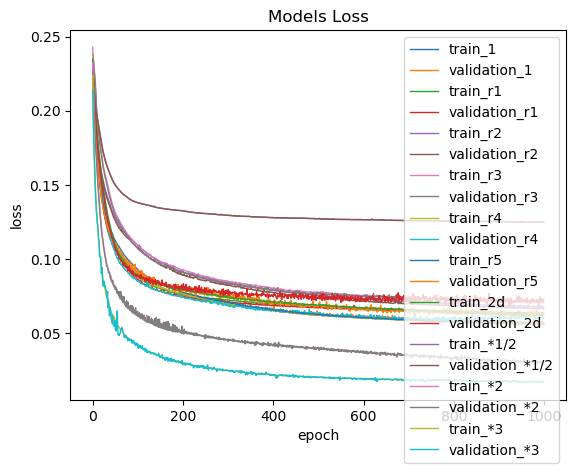

In [118]:
#PROBANDO
f = plt.figure()
plt.plot(history_1.history['loss'], linewidth=1)
plt.plot(history_1.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor1.history['loss'], linewidth=1)
plt.plot(history_1_wdor1.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor2.history['loss'], linewidth=1)
plt.plot(history_1_wdor2.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor3.history['loss'], linewidth=1)
plt.plot(history_1_wdor3.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor4.history['loss'], linewidth=1)
plt.plot(history_1_wdor4.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor5.history['loss'], linewidth=1)
plt.plot(history_1_wdor5.history['val_loss'], linewidth=1)
plt.plot(history_1_wdo2.history['loss'], linewidth=1)
plt.plot(history_1_wdo2.history['val_loss'], linewidth=1)
plt.plot(history_1b.history['loss'], linewidth=1)
plt.plot(history_1b.history['val_loss'], linewidth=1)
plt.plot(history_1c.history['loss'], linewidth=1)
plt.plot(history_1c.history['val_loss'], linewidth=1)
plt.plot(history_1d.history['loss'], linewidth=1)
plt.plot(history_1d.history['val_loss'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_1', 'validation_1','train_r1', 'validation_r1','train_r2', 'validation_r2','train_r3', 'validation_r3','train_r4', 'validation_r4','train_r5', 'validation_r5','train_2d', 'validation_2d','train_*1/2', 'validation_*1/2','train_*2', 'validation_*2','train_*3', 'validation_*3'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

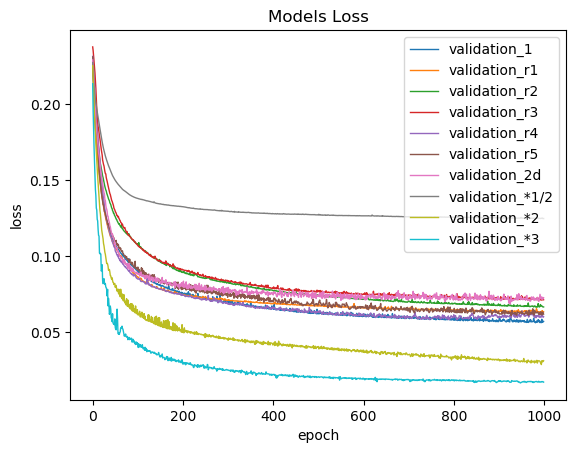

In [119]:
#PROBANDO
f = plt.figure()
plt.plot(history_1.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor1.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor2.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor3.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor4.history['val_loss'], linewidth=1)
plt.plot(history_1_wdor5.history['val_loss'], linewidth=1)
plt.plot(history_1_wdo2.history['val_loss'], linewidth=1)
plt.plot(history_1b.history['val_loss'], linewidth=1)
plt.plot(history_1c.history['val_loss'], linewidth=1)
plt.plot(history_1d.history['val_loss'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['validation_1','validation_r1', 'validation_r2', 'validation_r3', 'validation_r4', 'validation_r5', 'validation_2d','validation_*1/2', 'validation_*2', 'validation_*3'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

dict_keys(['val_loss', 'val_coeff_determination', 'loss', 'coeff_determination'])


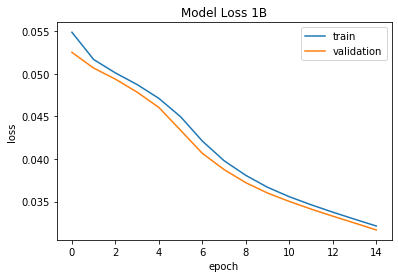

In [71]:
#PROBANDO
print(history_1b.history.keys())
plt.plot(history_1b.history['loss'])
plt.plot(history_1b.history['val_loss'])
plt.title('Model Loss 1B')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

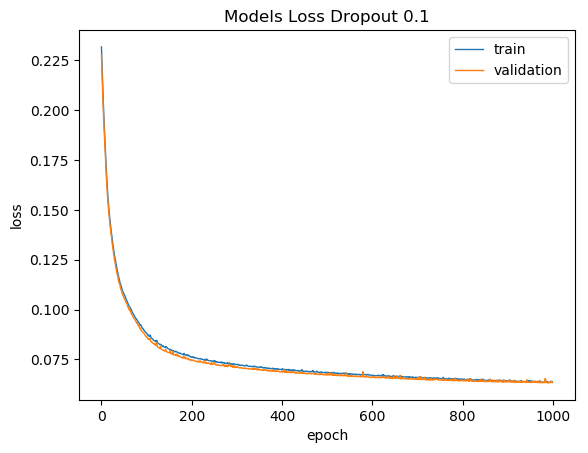

In [133]:
#PROBANDO
f = plt.figure()
plt.plot(history_1_wdor1.history['loss'], linewidth=1)
plt.plot(history_1_wdor1.history['val_loss'], linewidth=1)
plt.title('Model Loss Dropout 0.1')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

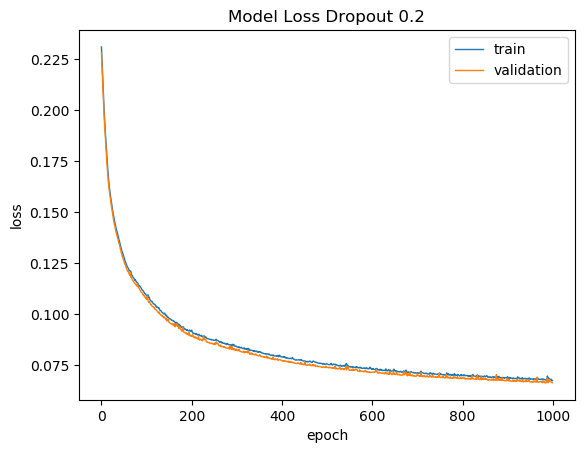

In [134]:
#PROBANDO
f = plt.figure()
plt.plot(history_1_wdor2.history['loss'], linewidth=1)
plt.plot(history_1_wdor2.history['val_loss'], linewidth=1)
plt.title('Model Loss Dropout 0.2')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

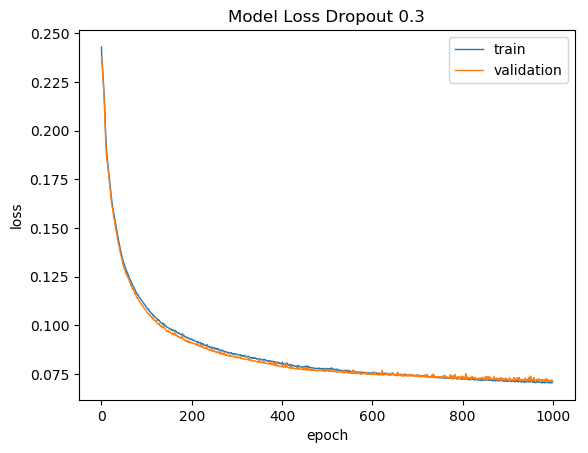

In [135]:
#PROBANDO
f = plt.figure()
plt.plot(history_1_wdor3.history['loss'], linewidth=1)
plt.plot(history_1_wdor3.history['val_loss'], linewidth=1)
plt.title('Model Loss Dropout 0.3')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

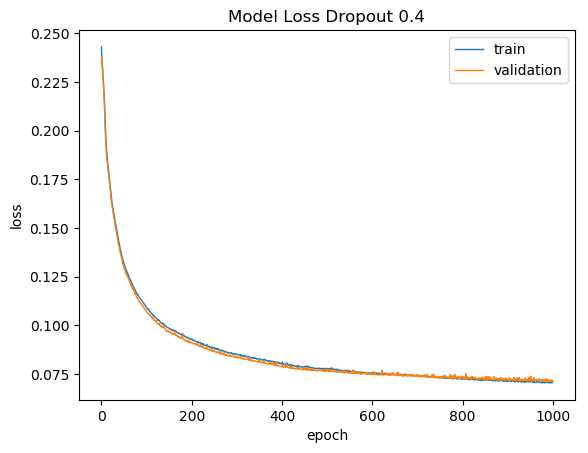

In [136]:
#PROBANDO
f = plt.figure()
plt.plot(history_1_wdor3.history['loss'], linewidth=1)
plt.plot(history_1_wdor3.history['val_loss'], linewidth=1)
plt.title('Model Loss Dropout 0.4')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

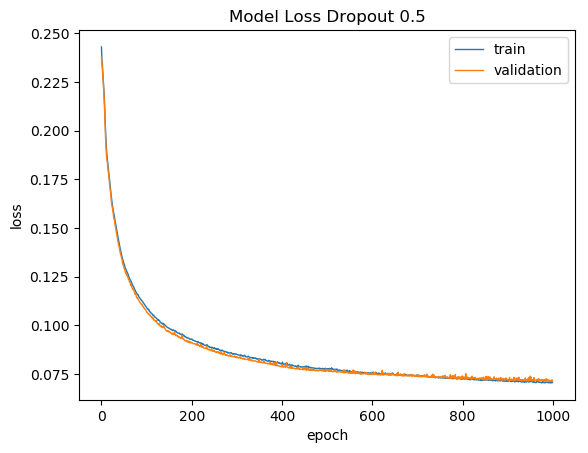

In [137]:
#PROBANDO
f = plt.figure()
plt.plot(history_1_wdor3.history['loss'], linewidth=1)
plt.plot(history_1_wdor3.history['val_loss'], linewidth=1)
plt.title('Model Loss Dropout 0.5')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

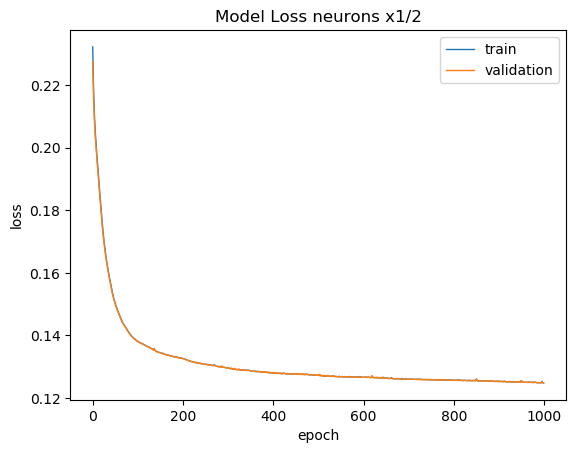

In [139]:
#PROBANDO
f = plt.figure()
plt.plot(history_1b.history['loss'], linewidth=1)
plt.plot(history_1b.history['val_loss'], linewidth=1)
plt.title('Model Loss neurons x1/2')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

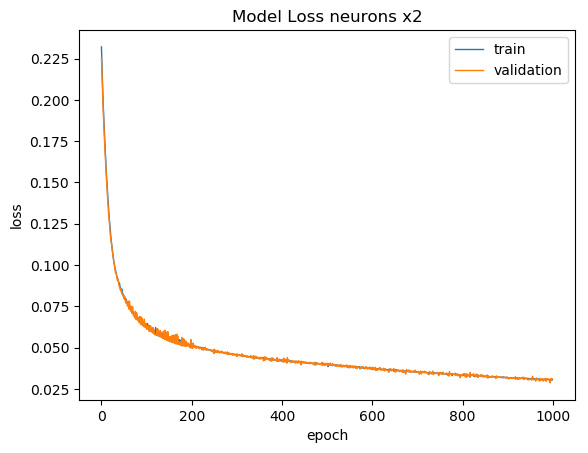

In [141]:
#PROBANDO
f = plt.figure()
plt.plot(history_1c.history['loss'], linewidth=1)
plt.plot(history_1c.history['val_loss'], linewidth=1)
plt.title('Model Loss neurons x2')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

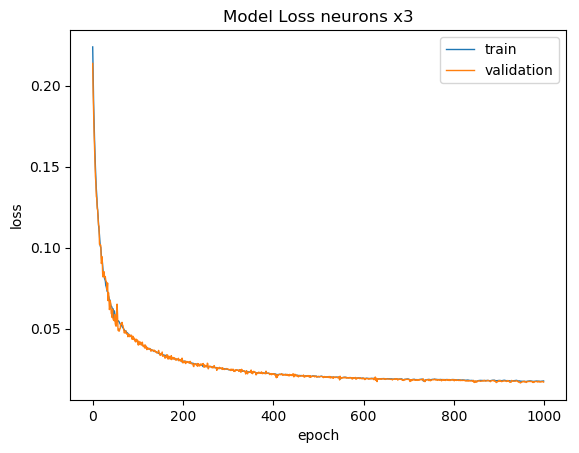

In [142]:
#PROBANDO
f = plt.figure()
plt.plot(history_1d.history['loss'], linewidth=1)
plt.plot(history_1d.history['val_loss'], linewidth=1)
plt.title('Model Loss neurons x3')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

In [120]:
#PROBANDO
from keras.models import Model
from keras.layers import Input, add
from keras.layers.core import Layer, Dense, Dropout, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D, UpSampling2D

input_nn = Input(shape=X1_training.shape[1:]) 
# Encoder
conv1_1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_nn)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1_1)
D1 = Dropout(rate=0.4)(pool1)
conv1_2 = Conv2D(32, (3, 3), activation='relu', padding='same')(D1)
pool2 = MaxPooling2D((2, 2), padding='same')(conv1_2)
D2 = Dropout(rate=0.4)(pool2)
conv1_3 = Conv2D(32, (3, 3), activation='relu', padding='same')(D2)
h = MaxPooling2D((2, 2), padding='same')(conv1_3)


# Decoder
conv2_1 = Conv2D(32, (3, 3), activation='relu', padding='same')(h)
up1 = UpSampling2D((2, 2))(conv2_1)
D3 = Dropout(rate=0.4)(up1)
conv2_2 = Conv2D(32, (3, 3), activation='relu', padding='same')(D3)
up2 = UpSampling2D((2, 2))(conv2_2)
D4 = Dropout(rate=0.4)(up2)
conv2_3 = Conv2D(64, (3, 3), activation='relu', padding='same')(D4)
up3 = UpSampling2D((2, 2))(conv2_3)
D5 = Dropout(rate=0.4)(up3)
output_nn = Conv2D(1, (3, 3), activation='linear', padding='same')(D5)

autoencoder1_xf = Model(inputs=input_nn, outputs=output_nn)
autoencoder1_xf.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_184 (Conv2D)          (None, 64, 64, 64)        640       
_________________________________________________________________
max_pooling2d_82 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_185 (Conv2D)          (None, 32, 32, 32)        18464     
_________________________________________________________________
max_pooling2d_83 (MaxPooling (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 16, 16, 32)        0         
__________

In [122]:
autoencoder1_xf.compile(loss=root_mean_squared_error,optimizer="adam",metrics=[coeff_determination,'mape','mae'])

In [123]:
#PROBANDO
epochs = 1000
batch_size = 32
history_1 = autoencoder1_xf.fit(X1_training, Y1_training, batch_size=batch_size, epochs=epochs, verbose=2,validation_data=(X1_test,Y1_test))

Train on 255 samples, validate on 110 samples
Epoch 1/1000
 - 4s - loss: 0.2415 - coeff_determination: -4.7937e-02 - mean_absolute_percentage_error: 46734580.4392 - mean_absolute_error: 0.0827 - val_loss: 0.2356 - val_coeff_determination: 0.0082 - val_mean_absolute_percentage_error: 10192528.1273 - val_mean_absolute_error: 0.0473
Epoch 2/1000
 - 2s - loss: 0.2286 - coeff_determination: 0.0655 - mean_absolute_percentage_error: 41874333.2078 - mean_absolute_error: 0.0760 - val_loss: 0.2329 - val_coeff_determination: 0.0300 - val_mean_absolute_percentage_error: 6628464.8545 - val_mean_absolute_error: 0.0434
Epoch 3/1000
 - 2s - loss: 0.2248 - coeff_determination: 0.0968 - mean_absolute_percentage_error: 32843401.8118 - mean_absolute_error: 0.0662 - val_loss: 0.2291 - val_coeff_determination: 0.0615 - val_mean_absolute_percentage_error: 7393587.0273 - val_mean_absolute_error: 0.0436
Epoch 4/1000
 - 2s - loss: 0.2207 - coeff_determination: 0.1293 - mean_absolute_percentage_error: 30822162.0

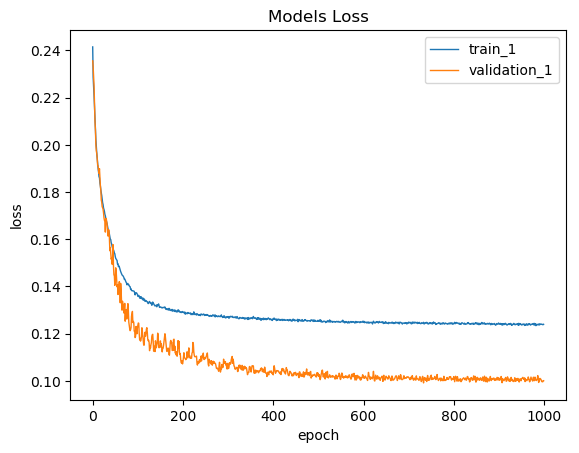

In [124]:
#PROBANDO
f = plt.figure()
plt.plot(history_1.history['loss'], linewidth=1)
plt.plot(history_1.history['val_loss'], linewidth=1)
plt.title('Models Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_1', 'validation_1'], loc='upper right')
plt.show()
#f.savefig('mxtest2.pdf', bbox_inches='tight')

In [125]:
#PROBANDO
print("Mínimo valor de perdida: ",min(history_1.history['val_loss']), "en el epoch ",history_1.history['val_loss'].index(min(history_1.history['val_loss'])))

Mínimo valor de perdida:  0.09913348975506696 en el epoch  733


<h5><center>FIN DE PRUEBAS</center></h5>